In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numpy import exp, abs, log
from scipy.special import gamma, factorial
import os
import scipy.stats as stats
import statsmodels.api as sm

In [75]:
def get_res(path, phase, maxiter, subn, lb):
    data_path1 = path%(phase, maxiter, subn, lb)
    print(data_path1)
    data1 = np.load(data_path1)
    return data1['predY0'], data1['std_varY0'], data1['val_predY0'], data1['val_std_varY0'], data1['sample_Y0']

def ucb_strategy(lam, predY0, std_varY0, sample_Y0):
    rt_v = []
    ninvest = 10

    for i in range(len(predY0)):
        p = predY0[i]
        sell_idx = np.argsort(p-lam*std_varY0[i])[:ninvest//2]
        buy_idx = np.argsort(-(p+lam*std_varY0[i]))[:ninvest//2]
        rr = 1/ninvest
        tmp = rr*(sum(exp(sample_Y0[i, buy_idx]))+sum(exp(-sample_Y0[i, sell_idx])))
        rt_v.append(log(tmp))
    return rt_v

def max_redraw(rt_v):
    res = max([rt_v[i] - min(rt_v[i+1:]) for i in range(len(rt_v)-1)])
    return res

In [78]:
testv = np.arange(-0.1, 0.10001, 0.01)    

In [88]:
def run(path, maxiter, subn, lb, figsize=(10,5), testv=testv):
    rt_lst, rd_lst, naive_lst = [], [], []
    for phs in range(4,11):
        print('Phase %d'%phs)

        print('Validating...')
        _, _, predY0, std_varY0, sample_Y0 = get_res(path, phs, maxiter, subn, lb)

        print('UCB strategy')
        best_logrt = -np.inf
        best_rt_lam = 0
        best_rd = np.inf
        best_rd_lam = 0
        plt.figure(figsize=figsize)
        for lam in testv:
            rt_v=ucb_strategy(lam, predY0, std_varY0, sample_Y0)
            rd = maxredraw(rt_v)
            print('lambda: %.3f   Total log return: %.8f    Max redraw: %.8f' % (lam, sum(rt_v), rd))
            if sum(rt_v)>best_logrt:
                best_logrt=sum(rt_v)
                best_rt_lam=lam
            if rd<best_rd:
                best_rd=rd
                best_rd_lam=lam
            exp_rt=rt_v
            for i in range(1, len(rt_v)):
                exp_rt[i]+=exp_rt[i-1]
            exp_rt = exp(exp_rt)
            plt.plot(exp_rt, color='gray', linewidth=0.2)
        rt_v=ucb_strategy(best_rt_lam, predY0, std_varY0, sample_Y0)
        print('best return lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b-', label='best return, lambda=%.3f'%best_rt_lam)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        print('best redraw lambda: %.3f   Total log return: %.8f' % (best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g-', label='best redraw, lambda=%.3f'%best_rd_lam)
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Validation UCB');    plt.grid();    plt.legend();    plt.show()
        val_best_rt_lam = best_rt_lam
        val_best_rd_lam = best_rd_lam



        print('Testing...')
        predY0, std_varY0, _, _, sample_Y0 = get_res(path, phs, maxiter, subn, lb)

        print('UCB strategy')
        best_logrt = -np.inf
        best_rt_lam = 0
        best_rd = np.inf
        best_rd_lam = 0
        plt.figure(figsize=figsize)
        for lam in testv:
            rt_v=ucb_strategy(lam, predY0, std_varY0, sample_Y0)
            rd = maxredraw(rt_v)
            print('lambda: %.3f   Total log return: %.8f    Max redraw: %.8f' % (lam, sum(rt_v), rd))
            if sum(rt_v)>best_logrt:
                best_logrt=sum(rt_v)
                best_rt_lam=lam
            if rd<best_rd:
                best_rd=rd
                best_rd_lam=lam
            exp_rt=rt_v
            for i in range(1, len(rt_v)):
                exp_rt[i]+=exp_rt[i-1]
            exp_rt = exp(exp_rt)
            plt.plot(exp_rt, color='gray', linewidth=0.2)
        rt_v=ucb_strategy(best_rt_lam, predY0, std_varY0, sample_Y0)
        print('best return lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b--', label='best return, lambda=%.3f'%best_rt_lam, linewidth=0.2)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        print('best redraw lambda: %.3f   Total log return: %.8f' % (best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g--', label='best redraw, lambda=%.3f'%best_rd_lam, linewidth=0.2)

        print('------------------------------------------------------------------------------------')

        rt_v=ucb_strategy(val_best_rt_lam, predY0, std_varY0, sample_Y0)
        rt_lst += rt_v.copy()
        print('best return val lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b', label='best return, val lambda=%.3f'%val_best_rt_lam)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        rd_lst += rt_v.copy()
        print('best redraw val lambda: %.3f   Total log return: %.8f' % (val_best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g', label='best redraw, val lambda=%.3f'%val_best_rd_lam)
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        naive_lst += rt_v.copy()
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Test UCB');    plt.grid();    plt.legend();    plt.show()
    print('-----------------------------Final result-----------------------------')
    plt.figure(figsize=figsize)
    rt_v=rt_lst
    print('best return strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'b', label='best return strategy')
    rt_v=rd_lst
    print('best redraw strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'g', label='best redraw strategy')
    rt_v=naive_lst
    print('Naive strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'y-', label='Naive strategy')
    plt.title('Overall Test');    plt.grid();    plt.legend();    plt.show()

# Results

## main2_inv_M20_iter5000_mat10_subn100_lb5_s5_log GGD

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 5000 --subn 100 --lb 5 --ggd --matid 48 35 83 25 84 19 21 71 24 68 --M 20 --inverse --gpu 0  > ./log/main2_inv_ggd_M20_iter5000_mat10_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.01342596    Max redraw: 0.05962023
lambda: -0.090   Total log return: 0.02569798    Max redraw: 0.05962023
lambda: -0.080   Total log return: 0.02520477    Max redraw: 0.05962023
lambda: -0.070   Total log return: 0.02243542    Max redraw: 0.05962023
lambda: -0.060   Total log return: 0.03175286    Max redraw: 0.05962023
lambda: -0.050   Total log return: 0.03915896    Max redraw: 0.05962023
lambda: -0.040   Total log return: 0.02733395    Max redraw: 0.05962023
lambda: -0.030   Total log return: 0.03500892    Max redraw: 0.05962023
lambda: -0.020   Total log return: 0.03960881    Max redraw: 0.06287542
lambda: -0.010   Total log return: 0.04342757    Max redraw: 0.06287542
lambda: -0.000   Total log return: 0.04595717    Max redraw: 0.06287542
lambda: 0.010   Total log return: 0.05216912    Max redraw: 0.06287542
lambda: 0.020   Total log return: 0.06200000    Max redraw

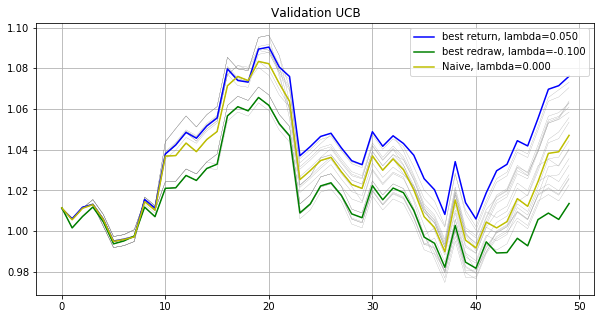

Testing...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.00810635    Max redraw: 0.05137542
lambda: -0.090   Total log return: 0.00818290    Max redraw: 0.05137542
lambda: -0.080   Total log return: 0.02202093    Max redraw: 0.05137542
lambda: -0.070   Total log return: 0.02897116    Max redraw: 0.05137542
lambda: -0.060   Total log return: 0.03416891    Max redraw: 0.05137542
lambda: -0.050   Total log return: 0.05063820    Max redraw: 0.05137542
lambda: -0.040   Total log return: 0.03278666    Max redraw: 0.05137542
lambda: -0.030   Total log return: 0.03930568    Max redraw: 0.05137542
lambda: -0.020   Total log return: 0.04485902    Max redraw: 0.05137542
lambda: -0.010   Total log return: 0.03649021    Max redraw: 0.05137542
lambda: -0.000   Total log return: 0.03252013    Max redraw: 0.05043257
lambda: 0.010   Total log return: 0.02202897    Max redraw: 0.05043257
lambda: 0.020   Total log return: 0.02029589    Max redraw: 0.051924

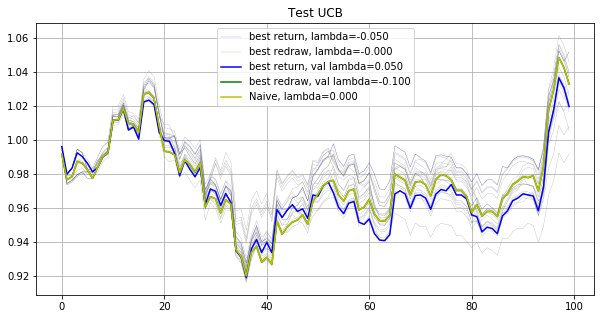

Phase 5
Validating...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.03721713    Max redraw: 0.03372205
lambda: -0.090   Total log return: 0.03584407    Max redraw: 0.03800708
lambda: -0.080   Total log return: 0.03632103    Max redraw: 0.03710215
lambda: -0.070   Total log return: 0.04314358    Max redraw: 0.03065422
lambda: -0.060   Total log return: 0.05745832    Max redraw: 0.03065422
lambda: -0.050   Total log return: 0.05388565    Max redraw: 0.03065422
lambda: -0.040   Total log return: 0.03838997    Max redraw: 0.02994136
lambda: -0.030   Total log return: 0.03795900    Max redraw: 0.02994136
lambda: -0.020   Total log return: 0.03472583    Max redraw: 0.02994136
lambda: -0.010   Total log return: 0.02603096    Max redraw: 0.02994136
lambda: -0.000   Total log return: 0.02774362    Max redraw: 0.02994136
lambda: 0.010   Total log return: 0.01630392    Max redraw: 0.02994136
lambda: 0.020   Total log return: 0.00955512    Max redraw

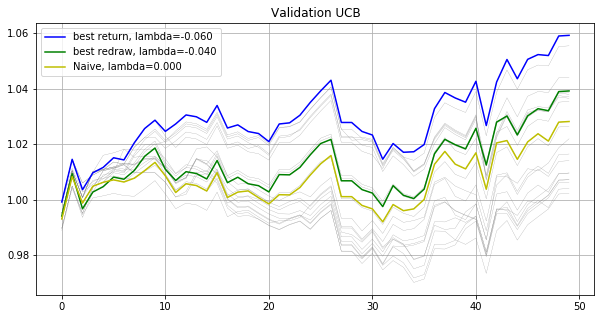

Testing...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.08209332    Max redraw: 0.06507042
lambda: -0.090   Total log return: 0.07798498    Max redraw: 0.06297412
lambda: -0.080   Total log return: 0.08422259    Max redraw: 0.06297412
lambda: -0.070   Total log return: 0.09813888    Max redraw: 0.06137988
lambda: -0.060   Total log return: 0.08656973    Max redraw: 0.06588650
lambda: -0.050   Total log return: 0.10424508    Max redraw: 0.06588650
lambda: -0.040   Total log return: 0.10089731    Max redraw: 0.06588650
lambda: -0.030   Total log return: 0.08236704    Max redraw: 0.06588650
lambda: -0.020   Total log return: 0.07390463    Max redraw: 0.06654270
lambda: -0.010   Total log return: 0.08052859    Max redraw: 0.06549709
lambda: -0.000   Total log return: 0.07472914    Max redraw: 0.06549709
lambda: 0.010   Total log return: 0.09405400    Max redraw: 0.06549709
lambda: 0.020   Total log return: 0.09144728    Max redraw: 0.0627619

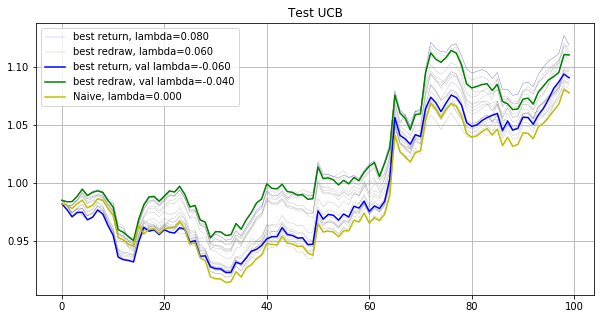

Phase 6
Validating...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.01140202    Max redraw: 0.04776617
lambda: -0.090   Total log return: 0.01802978    Max redraw: 0.04776617
lambda: -0.080   Total log return: 0.00949762    Max redraw: 0.04776617
lambda: -0.070   Total log return: 0.01418982    Max redraw: 0.05373703
lambda: -0.060   Total log return: 0.02124690    Max redraw: 0.05373703
lambda: -0.050   Total log return: 0.02562077    Max redraw: 0.05559620
lambda: -0.040   Total log return: 0.02450625    Max redraw: 0.05559620
lambda: -0.030   Total log return: 0.02210810    Max redraw: 0.05559620
lambda: -0.020   Total log return: 0.05875383    Max redraw: 0.02425983
lambda: -0.010   Total log return: 0.05962789    Max redraw: 0.02425983
lambda: -0.000   Total log return: 0.04157249    Max redraw: 0.04715124
lambda: 0.010   Total log return: 0.04587386    Max redraw: 0.04715124
lambda: 0.020   Total log return: 0.05098643    Max redraw

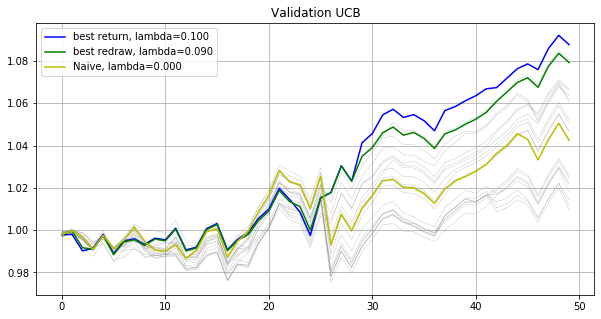

Testing...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.22499348    Max redraw: 0.03522771
lambda: -0.090   Total log return: 0.20886959    Max redraw: 0.03522771
lambda: -0.080   Total log return: 0.21225821    Max redraw: 0.03522771
lambda: -0.070   Total log return: 0.20103320    Max redraw: 0.03522771
lambda: -0.060   Total log return: 0.21207333    Max redraw: 0.03265953
lambda: -0.050   Total log return: 0.18958580    Max redraw: 0.03783017
lambda: -0.040   Total log return: 0.16838616    Max redraw: 0.03783017
lambda: -0.030   Total log return: 0.18179756    Max redraw: 0.03783017
lambda: -0.020   Total log return: 0.19311121    Max redraw: 0.03783017
lambda: -0.010   Total log return: 0.19534819    Max redraw: 0.04112678
lambda: -0.000   Total log return: 0.16789104    Max redraw: 0.04112678
lambda: 0.010   Total log return: 0.16898084    Max redraw: 0.04121156
lambda: 0.020   Total log return: 0.16383688    Max redraw: 0.0412115

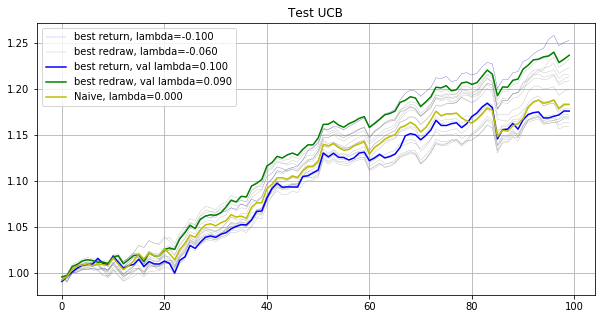

Phase 7
Validating...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.00380694    Max redraw: 0.02635464
lambda: -0.090   Total log return: -0.00077176    Max redraw: 0.02635464
lambda: -0.080   Total log return: -0.00979592    Max redraw: 0.02635464
lambda: -0.070   Total log return: -0.00338359    Max redraw: 0.02635464
lambda: -0.060   Total log return: -0.00416592    Max redraw: 0.02635464
lambda: -0.050   Total log return: -0.00380624    Max redraw: 0.02522861
lambda: -0.040   Total log return: 0.00041200    Max redraw: 0.02738797
lambda: -0.030   Total log return: -0.00740586    Max redraw: 0.02738797
lambda: -0.020   Total log return: -0.01014034    Max redraw: 0.02738797
lambda: -0.010   Total log return: 0.01251634    Max redraw: 0.03073654
lambda: -0.000   Total log return: 0.02011545    Max redraw: 0.03073654
lambda: 0.010   Total log return: 0.02943812    Max redraw: 0.03073654
lambda: 0.020   Total log return: 0.01929550    Ma

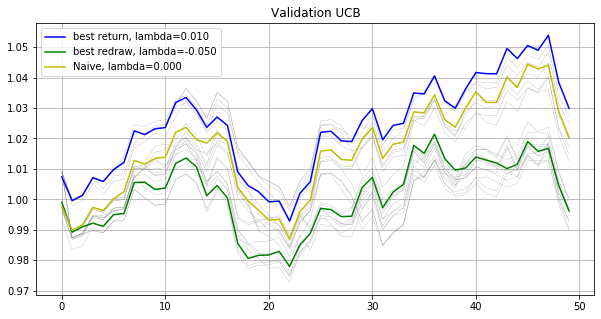

Testing...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.03292407    Max redraw: 0.04195171
lambda: -0.090   Total log return: 0.04529199    Max redraw: 0.04135355
lambda: -0.080   Total log return: 0.05466417    Max redraw: 0.04135355
lambda: -0.070   Total log return: 0.04191826    Max redraw: 0.04135355
lambda: -0.060   Total log return: 0.02709419    Max redraw: 0.03780978
lambda: -0.050   Total log return: 0.01293410    Max redraw: 0.03780978
lambda: -0.040   Total log return: 0.02256424    Max redraw: 0.03780978
lambda: -0.030   Total log return: 0.01922720    Max redraw: 0.03476660
lambda: -0.020   Total log return: 0.05290960    Max redraw: 0.03515291
lambda: -0.010   Total log return: 0.04310742    Max redraw: 0.03515291
lambda: -0.000   Total log return: 0.06867625    Max redraw: 0.03590469
lambda: 0.010   Total log return: 0.05931019    Max redraw: 0.03639993
lambda: 0.020   Total log return: 0.04122281    Max redraw: 0.0363999

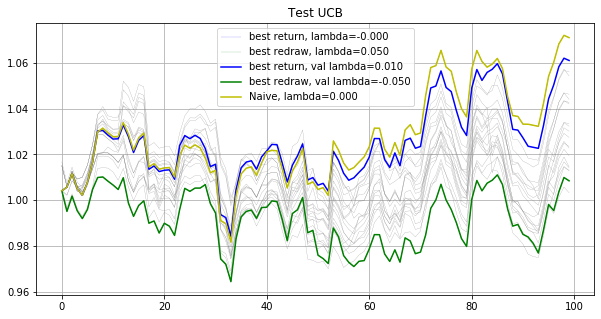

Phase 8
Validating...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00599714    Max redraw: 0.03154324
lambda: -0.090   Total log return: 0.02237457    Max redraw: 0.03154324
lambda: -0.080   Total log return: 0.02284505    Max redraw: 0.03154324
lambda: -0.070   Total log return: 0.01627215    Max redraw: 0.03380156
lambda: -0.060   Total log return: 0.02086639    Max redraw: 0.03380156
lambda: -0.050   Total log return: 0.02736657    Max redraw: 0.03380156
lambda: -0.040   Total log return: 0.01732973    Max redraw: 0.03638762
lambda: -0.030   Total log return: 0.00288862    Max redraw: 0.03638762
lambda: -0.020   Total log return: 0.00900624    Max redraw: 0.03638762
lambda: -0.010   Total log return: 0.00906276    Max redraw: 0.03224463
lambda: -0.000   Total log return: 0.00279546    Max redraw: 0.03224463
lambda: 0.010   Total log return: 0.00234344    Max redraw: 0.03224463
lambda: 0.020   Total log return: 0.00532693    Max redraw

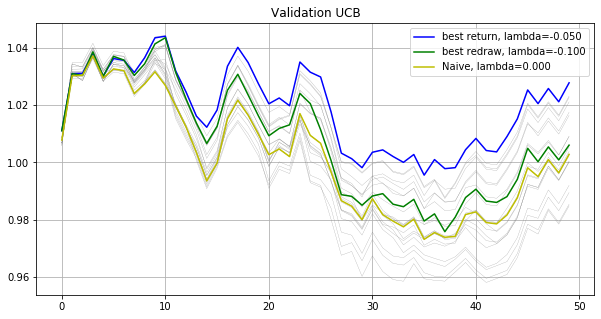

Testing...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.09578558    Max redraw: 0.04888048
lambda: -0.090   Total log return: 0.07208379    Max redraw: 0.04888048
lambda: -0.080   Total log return: 0.07252460    Max redraw: 0.04888048
lambda: -0.070   Total log return: 0.07352917    Max redraw: 0.05591512
lambda: -0.060   Total log return: 0.08014835    Max redraw: 0.05591512
lambda: -0.050   Total log return: 0.08483050    Max redraw: 0.05466914
lambda: -0.040   Total log return: 0.09132789    Max redraw: 0.05466914
lambda: -0.030   Total log return: 0.10842402    Max redraw: 0.04551385
lambda: -0.020   Total log return: 0.10516687    Max redraw: 0.04551385
lambda: -0.010   Total log return: 0.09743121    Max redraw: 0.04503656
lambda: -0.000   Total log return: 0.09901872    Max redraw: 0.04503656
lambda: 0.010   Total log return: 0.10013796    Max redraw: 0.04503656
lambda: 0.020   Total log return: 0.10585659    Max redraw: 0.0450365

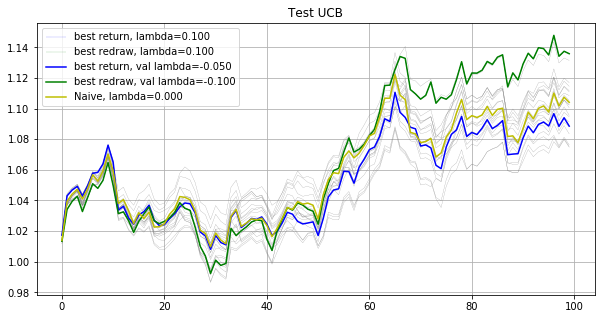

Phase 9
Validating...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00018628    Max redraw: 0.02699882
lambda: -0.090   Total log return: 0.00948444    Max redraw: 0.02446762
lambda: -0.080   Total log return: 0.01883573    Max redraw: 0.02698891
lambda: -0.070   Total log return: 0.01335688    Max redraw: 0.02698891
lambda: -0.060   Total log return: 0.01340196    Max redraw: 0.03086778
lambda: -0.050   Total log return: 0.02072168    Max redraw: 0.03086778
lambda: -0.040   Total log return: 0.00387852    Max redraw: 0.03086778
lambda: -0.030   Total log return: 0.00295891    Max redraw: 0.03086778
lambda: -0.020   Total log return: 0.03795405    Max redraw: 0.03265354
lambda: -0.010   Total log return: 0.04170326    Max redraw: 0.03149784
lambda: -0.000   Total log return: 0.03922085    Max redraw: 0.02883420
lambda: 0.010   Total log return: 0.02740144    Max redraw: 0.03383656
lambda: 0.020   Total log return: 0.03405049    Max redraw

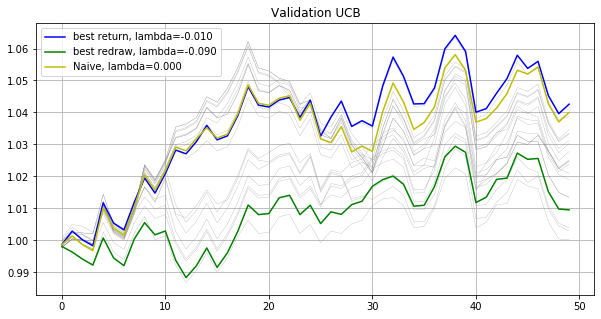

Testing...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.06023456    Max redraw: 0.04659731
lambda: -0.090   Total log return: 0.05186535    Max redraw: 0.04659731
lambda: -0.080   Total log return: 0.00773642    Max redraw: 0.04659731
lambda: -0.070   Total log return: 0.01451243    Max redraw: 0.04586147
lambda: -0.060   Total log return: -0.00083771    Max redraw: 0.04586147
lambda: -0.050   Total log return: 0.01293282    Max redraw: 0.03577201
lambda: -0.040   Total log return: -0.00779287    Max redraw: 0.03577201
lambda: -0.030   Total log return: 0.02816065    Max redraw: 0.03523689
lambda: -0.020   Total log return: 0.02287405    Max redraw: 0.03523689
lambda: -0.010   Total log return: 0.02464918    Max redraw: 0.03523689
lambda: -0.000   Total log return: 0.04401970    Max redraw: 0.03523689
lambda: 0.010   Total log return: 0.03320680    Max redraw: 0.03590087
lambda: 0.020   Total log return: 0.03685721    Max redraw: 0.03746

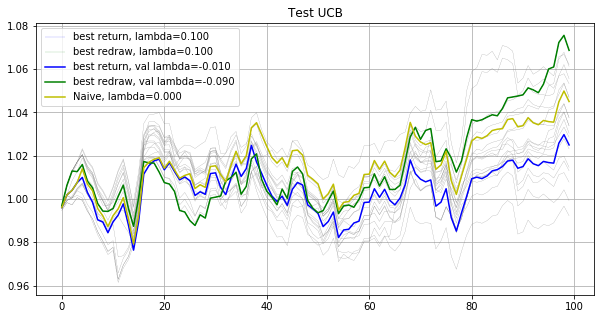

Phase 10
Validating...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.10891597    Max redraw: 0.03945987
lambda: -0.090   Total log return: -0.11203434    Max redraw: 0.03945987
lambda: -0.080   Total log return: -0.09797617    Max redraw: 0.03945987
lambda: -0.070   Total log return: -0.09029620    Max redraw: 0.03945987
lambda: -0.060   Total log return: -0.08025232    Max redraw: 0.04004093
lambda: -0.050   Total log return: -0.07474101    Max redraw: 0.04112280
lambda: -0.040   Total log return: -0.05919525    Max redraw: 0.04112280
lambda: -0.030   Total log return: -0.06193078    Max redraw: 0.04683306
lambda: -0.020   Total log return: -0.05095111    Max redraw: 0.04597319
lambda: -0.010   Total log return: -0.05150055    Max redraw: 0.04567513
lambda: -0.000   Total log return: -0.04051816    Max redraw: 0.04494961
lambda: 0.010   Total log return: -0.03449185    Max redraw: 0.04494961
lambda: 0.020   Total log return: -0.02602455

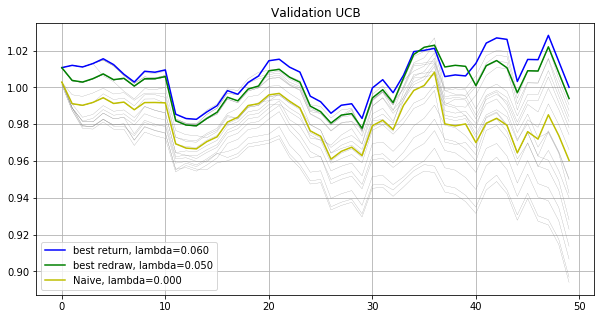

Testing...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.09873447    Max redraw: 0.03536422
lambda: -0.090   Total log return: 0.07586903    Max redraw: 0.03536422
lambda: -0.080   Total log return: 0.09460687    Max redraw: 0.03328014
lambda: -0.070   Total log return: 0.10128392    Max redraw: 0.03499845
lambda: -0.060   Total log return: 0.10935386    Max redraw: 0.03499845
lambda: -0.050   Total log return: 0.10992112    Max redraw: 0.03987281
lambda: -0.040   Total log return: 0.11663156    Max redraw: 0.03987281
lambda: -0.030   Total log return: 0.10360003    Max redraw: 0.03987281
lambda: -0.020   Total log return: 0.10220640    Max redraw: 0.03987281
lambda: -0.010   Total log return: 0.09458676    Max redraw: 0.03616513
lambda: -0.000   Total log return: 0.09523293    Max redraw: 0.03616513
lambda: 0.010   Total log return: 0.10213603    Max redraw: 0.03616513
lambda: 0.020   Total log return: 0.10343254    Max redraw: 0.0361651

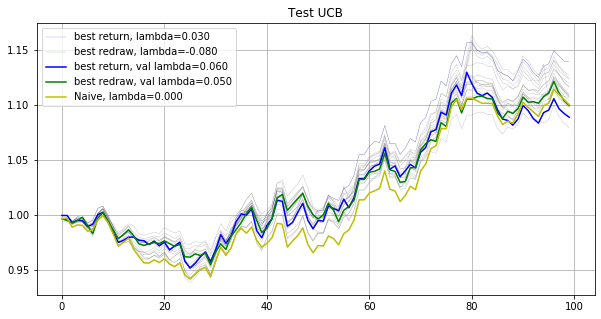

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.68486281
Mean return: 1.00074554
best redraw strategy
Total return: 1.90758911
Mean return: 1.00092305
Naive strategy
Total return: 1.78977141
Mean return: 1.00083190


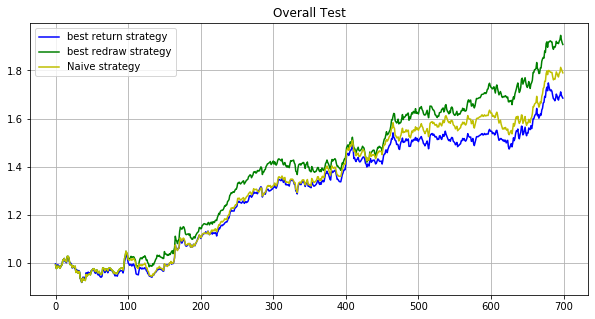

In [80]:
lb = 5
maxiter = 5000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb)

## main2_inv_M20_iter5000_mat10_subn100_lb10_s5 GGD

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 5000 --subn 100 --lb 10 --ggd --matid 48 35 83 25 84 19 21 71 24 68 --M 20 --inverse --gpu 0  > ./log/main2_inv_ggd_M20_iter5000_mat10_subn100_lb10_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: -0.05336720    Max redraw: 0.04423666
lambda: -0.090   Total log return: -0.05792371    Max redraw: 0.04423666
lambda: -0.080   Total log return: -0.06378707    Max redraw: 0.04423666
lambda: -0.070   Total log return: -0.07585998    Max redraw: 0.05825002
lambda: -0.060   Total log return: -0.05622846    Max redraw: 0.05825002
lambda: -0.050   Total log return: -0.06113935    Max redraw: 0.05825002
lambda: -0.040   Total log return: -0.06809569    Max redraw: 0.05825002
lambda: -0.030   Total log return: -0.06459037    Max redraw: 0.05825002
lambda: -0.020   Total log return: -0.06999421    Max redraw: 0.05825002
lambda: -0.010   Total log return: -0.07000195    Max redraw: 0.05825002
lambda: -0.000   Total log return: -0.07307508    Max redraw: 0.05825002
lambda: 0.010   Total log return: -0.06815452    Max redraw: 0.05825002
lambda: 0.020   Total log return: -0.05878378

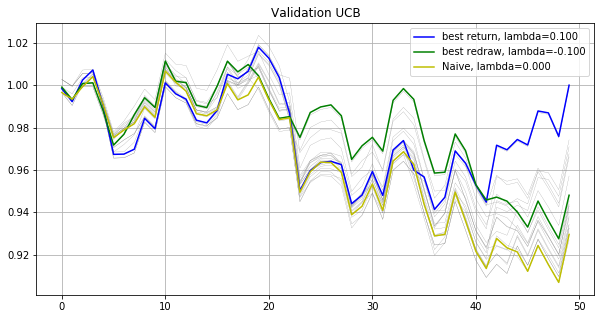

Testing...
./tmp2/res_phase04_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: -0.02587313    Max redraw: 0.04580515
lambda: -0.090   Total log return: -0.02568351    Max redraw: 0.04692190
lambda: -0.080   Total log return: -0.01493982    Max redraw: 0.05098066
lambda: -0.070   Total log return: -0.00041985    Max redraw: 0.05533879
lambda: -0.060   Total log return: -0.01313298    Max redraw: 0.05533879
lambda: -0.050   Total log return: -0.01830163    Max redraw: 0.05533879
lambda: -0.040   Total log return: -0.02608093    Max redraw: 0.05533879
lambda: -0.030   Total log return: -0.03912200    Max redraw: 0.05533879
lambda: -0.020   Total log return: -0.05839764    Max redraw: 0.05797125
lambda: -0.010   Total log return: -0.06267050    Max redraw: 0.05797125
lambda: -0.000   Total log return: -0.04824780    Max redraw: 0.05797125
lambda: 0.010   Total log return: -0.06368111    Max redraw: 0.05797125
lambda: 0.020   Total log return: -0.06663214    Max red

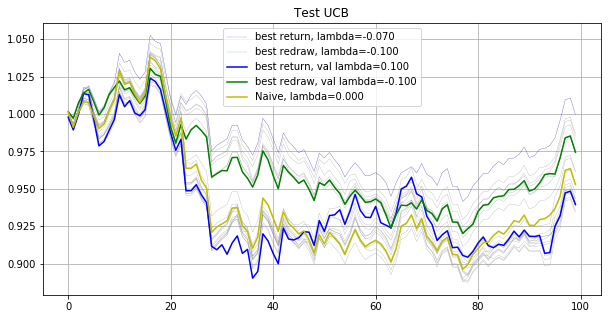

Phase 5
Validating...
./tmp2/res_phase05_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.00227633    Max redraw: 0.03228636
lambda: -0.090   Total log return: -0.00104142    Max redraw: 0.04115490
lambda: -0.080   Total log return: -0.00258285    Max redraw: 0.04115490
lambda: -0.070   Total log return: 0.00201530    Max redraw: 0.04010142
lambda: -0.060   Total log return: -0.00173907    Max redraw: 0.04010142
lambda: -0.050   Total log return: -0.01088243    Max redraw: 0.04123291
lambda: -0.040   Total log return: -0.01927810    Max redraw: 0.04123291
lambda: -0.030   Total log return: -0.02152818    Max redraw: 0.04123291
lambda: -0.020   Total log return: -0.00758367    Max redraw: 0.04494581
lambda: -0.010   Total log return: -0.02305705    Max redraw: 0.04494581
lambda: -0.000   Total log return: -0.02762171    Max redraw: 0.04494581
lambda: 0.010   Total log return: -0.01938505    Max redraw: 0.04494581
lambda: 0.020   Total log return: -0.01080173  

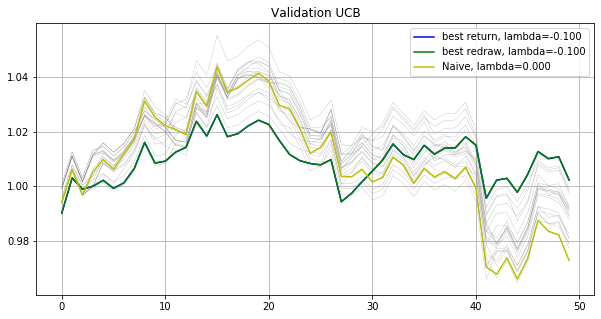

Testing...
./tmp2/res_phase05_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.03377330    Max redraw: 0.03162316
lambda: -0.090   Total log return: 0.02357061    Max redraw: 0.03162316
lambda: -0.080   Total log return: 0.08301848    Max redraw: 0.05217223
lambda: -0.070   Total log return: 0.08304919    Max redraw: 0.05152331
lambda: -0.060   Total log return: 0.07983821    Max redraw: 0.05152331
lambda: -0.050   Total log return: 0.07935555    Max redraw: 0.05390324
lambda: -0.040   Total log return: 0.08427882    Max redraw: 0.05390324
lambda: -0.030   Total log return: 0.05628266    Max redraw: 0.05790827
lambda: -0.020   Total log return: 0.03096443    Max redraw: 0.03012477
lambda: -0.010   Total log return: 0.02790356    Max redraw: 0.03265375
lambda: -0.000   Total log return: 0.02899316    Max redraw: 0.03265375
lambda: 0.010   Total log return: 0.03410703    Max redraw: 0.03265375
lambda: 0.020   Total log return: 0.02885172    Max redraw: 0.032653

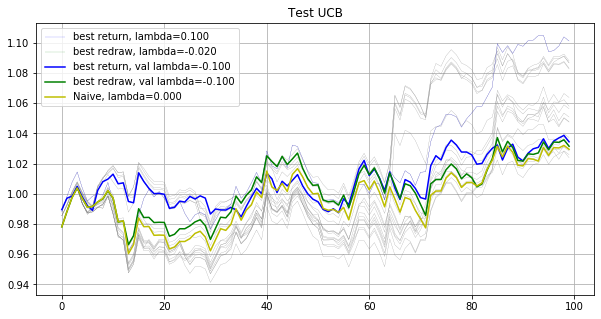

Phase 6
Validating...
./tmp2/res_phase06_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.04257249    Max redraw: 0.04040022
lambda: -0.090   Total log return: 0.04591756    Max redraw: 0.04040022
lambda: -0.080   Total log return: 0.05203021    Max redraw: 0.03832744
lambda: -0.070   Total log return: 0.04341422    Max redraw: 0.03832744
lambda: -0.060   Total log return: 0.06195157    Max redraw: 0.04151114
lambda: -0.050   Total log return: 0.06062991    Max redraw: 0.04151114
lambda: -0.040   Total log return: 0.06752470    Max redraw: 0.04240591
lambda: -0.030   Total log return: 0.07883805    Max redraw: 0.04240591
lambda: -0.020   Total log return: 0.07204798    Max redraw: 0.04240591
lambda: -0.010   Total log return: 0.07522469    Max redraw: 0.04240591
lambda: -0.000   Total log return: 0.10776017    Max redraw: 0.02609150
lambda: 0.010   Total log return: 0.10880200    Max redraw: 0.02609150
lambda: 0.020   Total log return: 0.11337854    Max redra

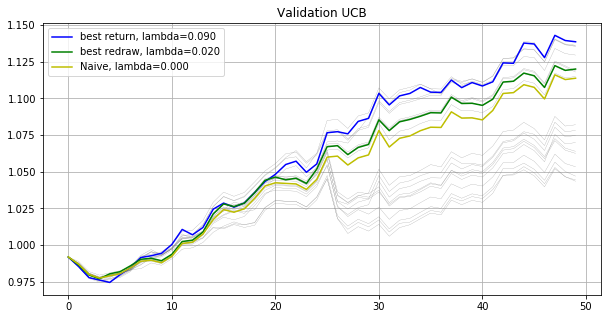

Testing...
./tmp2/res_phase06_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.07810322    Max redraw: 0.03980798
lambda: -0.090   Total log return: 0.07593217    Max redraw: 0.03980798
lambda: -0.080   Total log return: 0.06305443    Max redraw: 0.04353916
lambda: -0.070   Total log return: 0.05860016    Max redraw: 0.04869768
lambda: -0.060   Total log return: 0.07338226    Max redraw: 0.04869768
lambda: -0.050   Total log return: 0.09017445    Max redraw: 0.04869768
lambda: -0.040   Total log return: 0.09821373    Max redraw: 0.04869768
lambda: -0.030   Total log return: 0.08915331    Max redraw: 0.04869768
lambda: -0.020   Total log return: 0.08268734    Max redraw: 0.04869768
lambda: -0.010   Total log return: 0.08599983    Max redraw: 0.04602416
lambda: -0.000   Total log return: 0.12454587    Max redraw: 0.04894338
lambda: 0.010   Total log return: 0.12501957    Max redraw: 0.04894338
lambda: 0.020   Total log return: 0.12453621    Max redraw: 0.055717

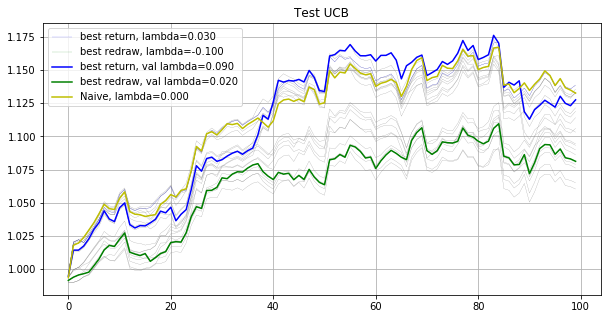

Phase 7
Validating...
./tmp2/res_phase07_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.05996900    Max redraw: 0.02951988
lambda: -0.090   Total log return: 0.06626147    Max redraw: 0.02923165
lambda: -0.080   Total log return: 0.06618277    Max redraw: 0.03135080
lambda: -0.070   Total log return: 0.06701616    Max redraw: 0.03135080
lambda: -0.060   Total log return: 0.08706051    Max redraw: 0.03135080
lambda: -0.050   Total log return: 0.07268416    Max redraw: 0.03595235
lambda: -0.040   Total log return: 0.07388581    Max redraw: 0.03595235
lambda: -0.030   Total log return: 0.07385457    Max redraw: 0.03595235
lambda: -0.020   Total log return: 0.07871373    Max redraw: 0.03716317
lambda: -0.010   Total log return: 0.06999827    Max redraw: 0.03716317
lambda: -0.000   Total log return: 0.07921944    Max redraw: 0.04075560
lambda: 0.010   Total log return: 0.07182338    Max redraw: 0.04075560
lambda: 0.020   Total log return: 0.07103845    Max redra

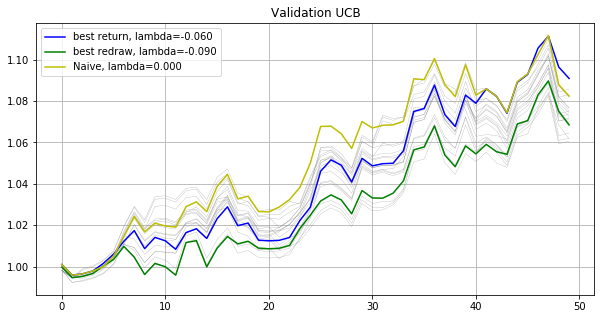

Testing...
./tmp2/res_phase07_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.09072224    Max redraw: 0.03790735
lambda: -0.090   Total log return: 0.07408554    Max redraw: 0.03579213
lambda: -0.080   Total log return: 0.09044362    Max redraw: 0.03579213
lambda: -0.070   Total log return: 0.07916923    Max redraw: 0.03579213
lambda: -0.060   Total log return: 0.08936612    Max redraw: 0.03579213
lambda: -0.050   Total log return: 0.08722867    Max redraw: 0.03497564
lambda: -0.040   Total log return: 0.07079406    Max redraw: 0.03497564
lambda: -0.030   Total log return: 0.08494021    Max redraw: 0.03497564
lambda: -0.020   Total log return: 0.07196837    Max redraw: 0.03497564
lambda: -0.010   Total log return: 0.08160696    Max redraw: 0.04043422
lambda: -0.000   Total log return: 0.07074610    Max redraw: 0.04043422
lambda: 0.010   Total log return: 0.09151829    Max redraw: 0.04043422
lambda: 0.020   Total log return: 0.06428348    Max redraw: 0.041844

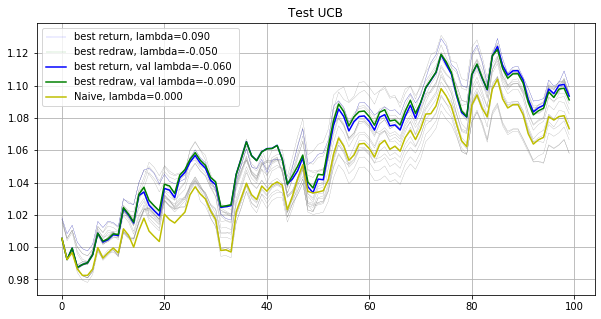

Phase 8
Validating...
./tmp2/res_phase08_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.04946060    Max redraw: 0.03345545
lambda: -0.090   Total log return: 0.04125838    Max redraw: 0.03290471
lambda: -0.080   Total log return: 0.03341439    Max redraw: 0.03290471
lambda: -0.070   Total log return: 0.03713577    Max redraw: 0.03290471
lambda: -0.060   Total log return: 0.03558256    Max redraw: 0.03290471
lambda: -0.050   Total log return: 0.03260302    Max redraw: 0.03290471
lambda: -0.040   Total log return: 0.03664795    Max redraw: 0.03453529
lambda: -0.030   Total log return: 0.03959120    Max redraw: 0.03453529
lambda: -0.020   Total log return: 0.03895840    Max redraw: 0.03453529
lambda: -0.010   Total log return: 0.04517365    Max redraw: 0.03382820
lambda: -0.000   Total log return: 0.04584708    Max redraw: 0.03382820
lambda: 0.010   Total log return: 0.03445973    Max redraw: 0.03171970
lambda: 0.020   Total log return: 0.03662105    Max redra

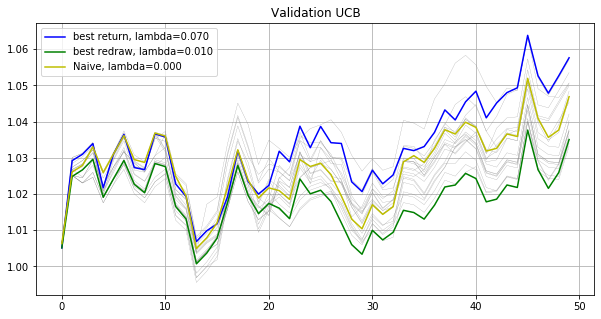

Testing...
./tmp2/res_phase08_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.04330964    Max redraw: 0.04252110
lambda: -0.090   Total log return: 0.02001517    Max redraw: 0.04252110
lambda: -0.080   Total log return: 0.02696528    Max redraw: 0.04252110
lambda: -0.070   Total log return: 0.03031976    Max redraw: 0.04252110
lambda: -0.060   Total log return: 0.02782005    Max redraw: 0.04252110
lambda: -0.050   Total log return: 0.03170888    Max redraw: 0.04530845
lambda: -0.040   Total log return: 0.03780567    Max redraw: 0.04530845
lambda: -0.030   Total log return: 0.03077913    Max redraw: 0.04530845
lambda: -0.020   Total log return: 0.02575760    Max redraw: 0.04530845
lambda: -0.010   Total log return: 0.02779722    Max redraw: 0.04530845
lambda: -0.000   Total log return: 0.03868656    Max redraw: 0.04977736
lambda: 0.010   Total log return: 0.03569505    Max redraw: 0.04210004
lambda: 0.020   Total log return: 0.04661348    Max redraw: 0.042100

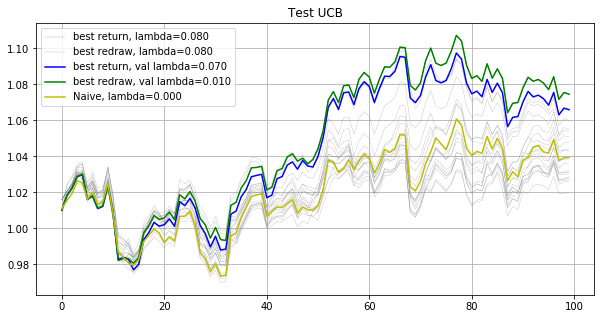

Phase 9
Validating...
./tmp2/res_phase09_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.03604878    Max redraw: 0.02953521
lambda: -0.090   Total log return: 0.04569007    Max redraw: 0.03106648
lambda: -0.080   Total log return: 0.04495925    Max redraw: 0.03876541
lambda: -0.070   Total log return: 0.04312482    Max redraw: 0.03642910
lambda: -0.060   Total log return: 0.05006261    Max redraw: 0.03780683
lambda: -0.050   Total log return: 0.04602079    Max redraw: 0.03780683
lambda: -0.040   Total log return: 0.04140102    Max redraw: 0.04008146
lambda: -0.030   Total log return: 0.04938870    Max redraw: 0.04008146
lambda: -0.020   Total log return: 0.03439491    Max redraw: 0.03752013
lambda: -0.010   Total log return: 0.04119066    Max redraw: 0.03752013
lambda: -0.000   Total log return: 0.03704099    Max redraw: 0.03752013
lambda: 0.010   Total log return: 0.02803653    Max redraw: 0.03752013
lambda: 0.020   Total log return: 0.03744733    Max redra

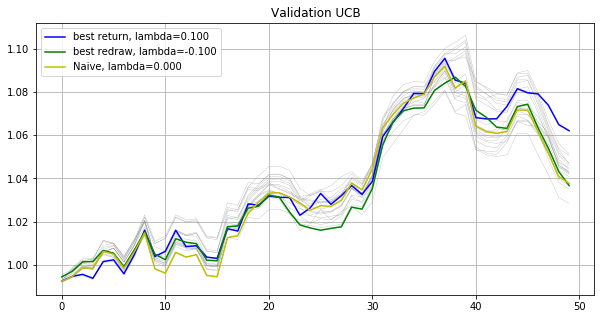

Testing...
./tmp2/res_phase09_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: -0.07396686    Max redraw: 0.03783317
lambda: -0.090   Total log return: -0.07707789    Max redraw: 0.03783317
lambda: -0.080   Total log return: -0.06151914    Max redraw: 0.03783317
lambda: -0.070   Total log return: -0.06541498    Max redraw: 0.03783317
lambda: -0.060   Total log return: -0.07419696    Max redraw: 0.03783317
lambda: -0.050   Total log return: -0.08474172    Max redraw: 0.03783317
lambda: -0.040   Total log return: -0.10746857    Max redraw: 0.03783317
lambda: -0.030   Total log return: -0.11937664    Max redraw: 0.03783317
lambda: -0.020   Total log return: -0.11934250    Max redraw: 0.03783317
lambda: -0.010   Total log return: -0.10317842    Max redraw: 0.03605809
lambda: -0.000   Total log return: -0.07016581    Max redraw: 0.03961587
lambda: 0.010   Total log return: -0.05341720    Max redraw: 0.03961587
lambda: 0.020   Total log return: -0.03832771    Max red

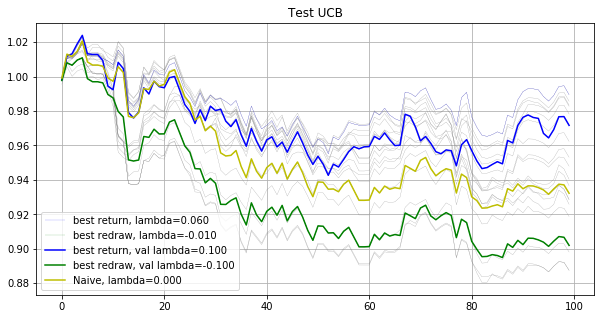

Phase 10
Validating...
./tmp2/res_phase10_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: -0.07713590    Max redraw: 0.04253533
lambda: -0.090   Total log return: -0.08492299    Max redraw: 0.04518201
lambda: -0.080   Total log return: -0.09643365    Max redraw: 0.04372045
lambda: -0.070   Total log return: -0.10735063    Max redraw: 0.04372045
lambda: -0.060   Total log return: -0.08007632    Max redraw: 0.04372045
lambda: -0.050   Total log return: -0.07172780    Max redraw: 0.04372045
lambda: -0.040   Total log return: -0.07351783    Max redraw: 0.04121292
lambda: -0.030   Total log return: -0.06605110    Max redraw: 0.04058336
lambda: -0.020   Total log return: -0.06948763    Max redraw: 0.04448125
lambda: -0.010   Total log return: -0.06797321    Max redraw: 0.04448125
lambda: -0.000   Total log return: -0.05940902    Max redraw: 0.04693941
lambda: 0.010   Total log return: -0.06653676    Max redraw: 0.04693941
lambda: 0.020   Total log return: -0.0647454

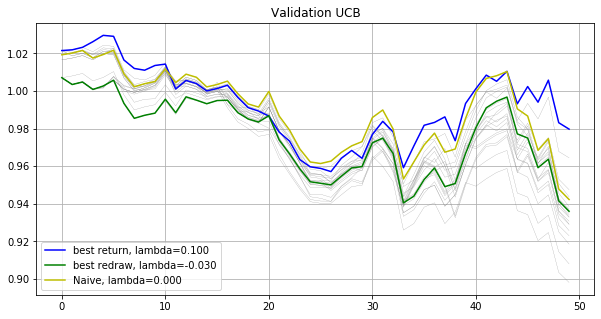

Testing...
./tmp2/res_phase10_iter5000_subn100_lb10.npz
UCB strategy
lambda: -0.100   Total log return: 0.02138480    Max redraw: 0.04318177
lambda: -0.090   Total log return: 0.02444870    Max redraw: 0.04318177
lambda: -0.080   Total log return: 0.01757166    Max redraw: 0.04324565
lambda: -0.070   Total log return: 0.03299129    Max redraw: 0.04324565
lambda: -0.060   Total log return: 0.03650037    Max redraw: 0.04324565
lambda: -0.050   Total log return: 0.06626345    Max redraw: 0.04423107
lambda: -0.040   Total log return: 0.07557928    Max redraw: 0.04423107
lambda: -0.030   Total log return: 0.07298327    Max redraw: 0.04423107
lambda: -0.020   Total log return: 0.03012787    Max redraw: 0.04652803
lambda: -0.010   Total log return: 0.03595578    Max redraw: 0.04871067
lambda: -0.000   Total log return: 0.04632670    Max redraw: 0.04871067
lambda: 0.010   Total log return: 0.02250082    Max redraw: 0.04921355
lambda: 0.020   Total log return: 0.02995718    Max redraw: 0.049213

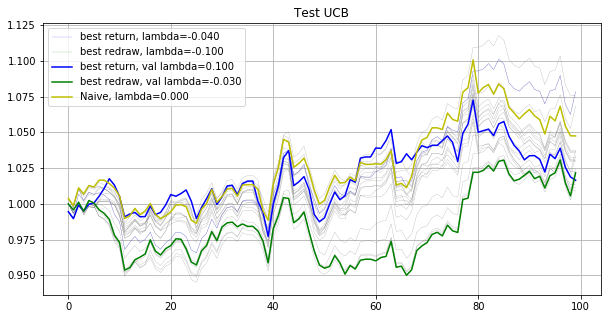

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.26147117
Mean return: 1.00033188
best redraw strategy
Total return: 1.17413731
Mean return: 1.00022936
Naive strategy
Total return: 1.21032000
Mean return: 1.00027273


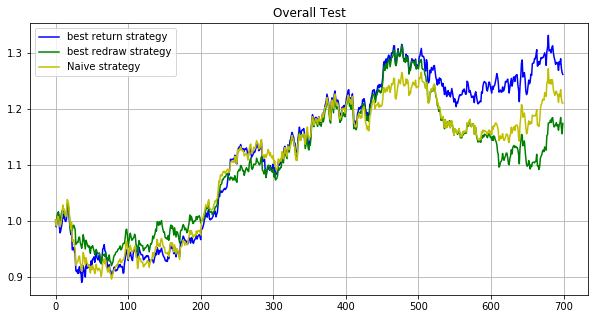

In [82]:
lb = 10
maxiter = 5000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb)

## main2_M20_iter5000_mat10_subn100_lb5_s5 GGD GGD

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 5000 --subn 100 --lb 5 --ggd --matid 48 35 83 25 84 19 21 71 24 68 --M 20 --gpu 0  > ./log/main2_ggd_M20_iter5000_mat10_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.01702664    Max redraw: 0.01676144
lambda: -0.090   Total log return: 0.01875558    Max redraw: 0.01676144
lambda: -0.080   Total log return: 0.01608051    Max redraw: 0.01676144
lambda: -0.070   Total log return: 0.01497373    Max redraw: 0.01676144
lambda: -0.060   Total log return: 0.01954968    Max redraw: 0.01676144
lambda: -0.050   Total log return: 0.02049885    Max redraw: 0.01615610
lambda: -0.040   Total log return: 0.01877091    Max redraw: 0.01615610
lambda: -0.030   Total log return: 0.01809731    Max redraw: 0.01615610
lambda: -0.020   Total log return: 0.01835193    Max redraw: 0.01897503
lambda: -0.010   Total log return: 0.01845667    Max redraw: 0.01897503
lambda: -0.000   Total log return: 0.01634366    Max redraw: 0.01897503
lambda: 0.010   Total log return: 0.01533426    Max redraw: 0.01897503
lambda: 0.020   Total log return: 0.01774250    Max redraw

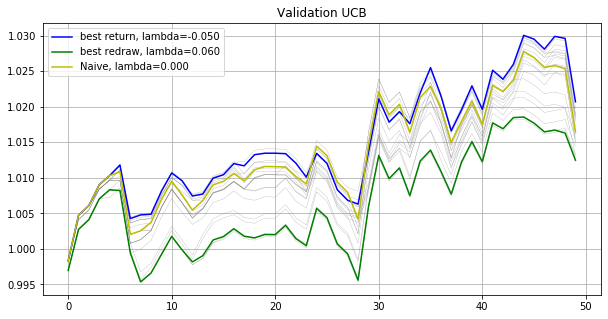

Testing...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.00716467    Max redraw: 0.02648926
lambda: -0.090   Total log return: -0.00567104    Max redraw: 0.02767672
lambda: -0.080   Total log return: -0.00276944    Max redraw: 0.02767672
lambda: -0.070   Total log return: 0.00529865    Max redraw: 0.02767672
lambda: -0.060   Total log return: 0.00389737    Max redraw: 0.02767672
lambda: -0.050   Total log return: 0.01169752    Max redraw: 0.02978120
lambda: -0.040   Total log return: 0.00937516    Max redraw: 0.02978120
lambda: -0.030   Total log return: 0.00474767    Max redraw: 0.02978120
lambda: -0.020   Total log return: 0.00342114    Max redraw: 0.02978120
lambda: -0.010   Total log return: 0.00147599    Max redraw: 0.02978120
lambda: -0.000   Total log return: 0.00834113    Max redraw: 0.02978120
lambda: 0.010   Total log return: 0.00918795    Max redraw: 0.02978120
lambda: 0.020   Total log return: 0.01199973    Max redraw: 0.0297

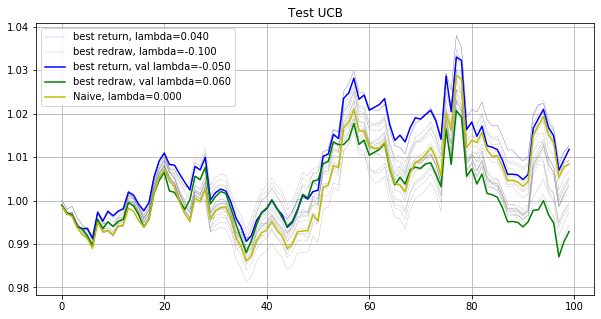

Phase 5
Validating...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00232321    Max redraw: 0.01919521
lambda: -0.090   Total log return: 0.00330469    Max redraw: 0.01919521
lambda: -0.080   Total log return: 0.00152557    Max redraw: 0.01919521
lambda: -0.070   Total log return: 0.00004500    Max redraw: 0.01919521
lambda: -0.060   Total log return: 0.00246057    Max redraw: 0.01919521
lambda: -0.050   Total log return: 0.00803099    Max redraw: 0.01733003
lambda: -0.040   Total log return: 0.00751688    Max redraw: 0.01733003
lambda: -0.030   Total log return: 0.00726942    Max redraw: 0.01733003
lambda: -0.020   Total log return: 0.00185448    Max redraw: 0.01656397
lambda: -0.010   Total log return: -0.00177300    Max redraw: 0.01656397
lambda: -0.000   Total log return: -0.00778422    Max redraw: 0.01656397
lambda: 0.010   Total log return: 0.00133283    Max redraw: 0.01656397
lambda: 0.020   Total log return: 0.00217057    Max redr

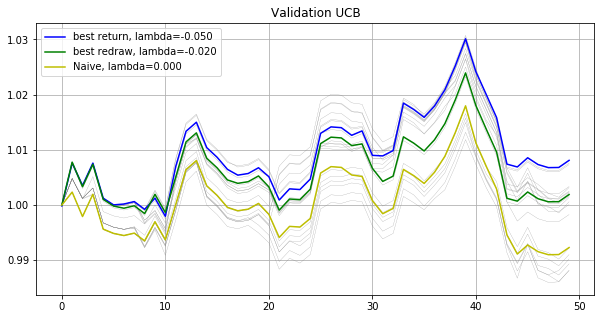

Testing...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.02772649    Max redraw: 0.03869415
lambda: -0.090   Total log return: -0.03495008    Max redraw: 0.03869415
lambda: -0.080   Total log return: -0.03817213    Max redraw: 0.03869415
lambda: -0.070   Total log return: -0.03332486    Max redraw: 0.03869415
lambda: -0.060   Total log return: -0.02711875    Max redraw: 0.03869415
lambda: -0.050   Total log return: -0.03014944    Max redraw: 0.03869415
lambda: -0.040   Total log return: -0.02866138    Max redraw: 0.03869415
lambda: -0.030   Total log return: -0.02773630    Max redraw: 0.03869415
lambda: -0.020   Total log return: -0.02354824    Max redraw: 0.03869415
lambda: -0.010   Total log return: -0.02003187    Max redraw: 0.03869415
lambda: -0.000   Total log return: -0.02674282    Max redraw: 0.03869415
lambda: 0.010   Total log return: -0.02901781    Max redraw: 0.03869415
lambda: 0.020   Total log return: -0.02639497    Max redr

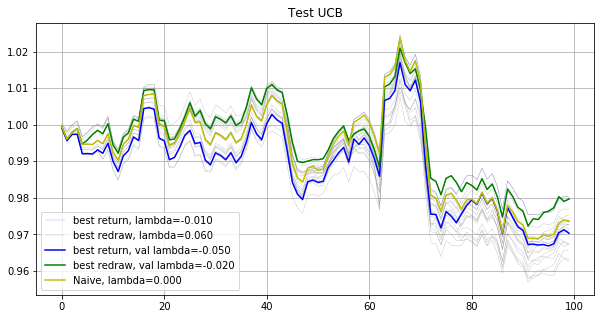

Phase 6
Validating...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.01025982    Max redraw: 0.01148117
lambda: -0.090   Total log return: -0.01382946    Max redraw: 0.01148117
lambda: -0.080   Total log return: -0.01304220    Max redraw: 0.01148117
lambda: -0.070   Total log return: -0.01007168    Max redraw: 0.01148117
lambda: -0.060   Total log return: -0.00576692    Max redraw: 0.01148117
lambda: -0.050   Total log return: -0.00569614    Max redraw: 0.01158659
lambda: -0.040   Total log return: -0.00658519    Max redraw: 0.01158659
lambda: -0.030   Total log return: -0.00569251    Max redraw: 0.01142695
lambda: -0.020   Total log return: -0.00625059    Max redraw: 0.01142695
lambda: -0.010   Total log return: -0.00548296    Max redraw: 0.01142695
lambda: -0.000   Total log return: -0.00102553    Max redraw: 0.01142695
lambda: 0.010   Total log return: -0.00332427    Max redraw: 0.01142695
lambda: 0.020   Total log return: -0.00154869 

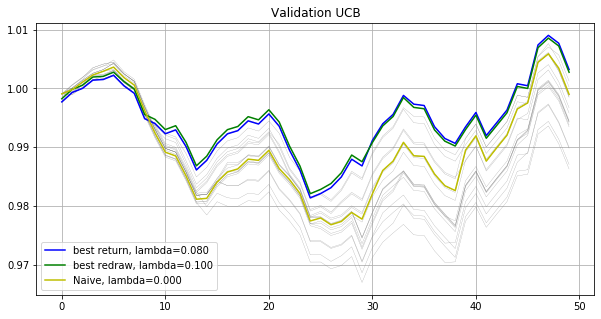

Testing...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.04761901    Max redraw: 0.01459326
lambda: -0.090   Total log return: 0.04319607    Max redraw: 0.01459326
lambda: -0.080   Total log return: 0.04210772    Max redraw: 0.01459326
lambda: -0.070   Total log return: 0.04338644    Max redraw: 0.01459326
lambda: -0.060   Total log return: 0.04415175    Max redraw: 0.01459326
lambda: -0.050   Total log return: 0.03998498    Max redraw: 0.01459326
lambda: -0.040   Total log return: 0.04111687    Max redraw: 0.01459326
lambda: -0.030   Total log return: 0.04373229    Max redraw: 0.01459326
lambda: -0.020   Total log return: 0.04220071    Max redraw: 0.01459326
lambda: -0.010   Total log return: 0.04476662    Max redraw: 0.01368969
lambda: -0.000   Total log return: 0.04939119    Max redraw: 0.01368969
lambda: 0.010   Total log return: 0.04975949    Max redraw: 0.01368969
lambda: 0.020   Total log return: 0.05183133    Max redraw: 0.0136896

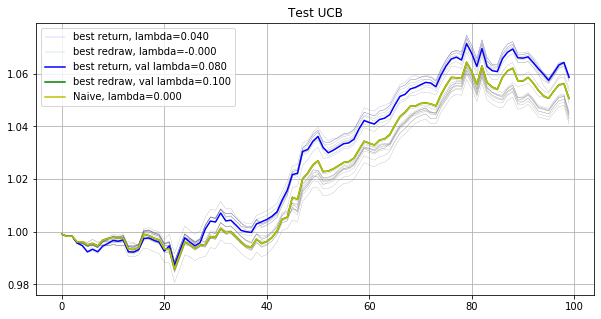

Phase 7
Validating...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.03142393    Max redraw: 0.01896075
lambda: -0.090   Total log return: 0.03438521    Max redraw: 0.01873319
lambda: -0.080   Total log return: 0.03372761    Max redraw: 0.01873319
lambda: -0.070   Total log return: 0.02961487    Max redraw: 0.01873319
lambda: -0.060   Total log return: 0.03014718    Max redraw: 0.01873319
lambda: -0.050   Total log return: 0.03439658    Max redraw: 0.01873319
lambda: -0.040   Total log return: 0.02784915    Max redraw: 0.01873319
lambda: -0.030   Total log return: 0.02833252    Max redraw: 0.01873319
lambda: -0.020   Total log return: 0.02791685    Max redraw: 0.01982056
lambda: -0.010   Total log return: 0.02827095    Max redraw: 0.01982056
lambda: -0.000   Total log return: 0.03121599    Max redraw: 0.02067302
lambda: 0.010   Total log return: 0.03398891    Max redraw: 0.01885705
lambda: 0.020   Total log return: 0.03444224    Max redraw

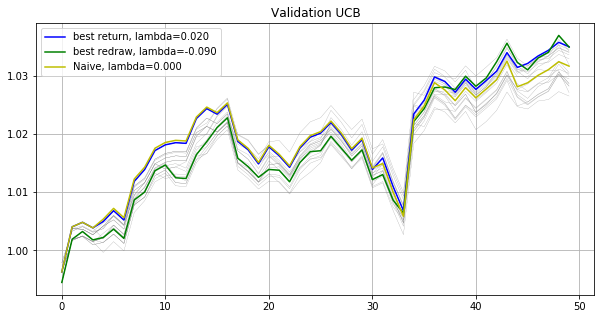

Testing...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.01269631    Max redraw: 0.01906410
lambda: -0.090   Total log return: 0.01875694    Max redraw: 0.01906410
lambda: -0.080   Total log return: 0.01490909    Max redraw: 0.01906929
lambda: -0.070   Total log return: 0.01774031    Max redraw: 0.01906929
lambda: -0.060   Total log return: 0.02048085    Max redraw: 0.01906929
lambda: -0.050   Total log return: 0.01496154    Max redraw: 0.01906929
lambda: -0.040   Total log return: 0.01125096    Max redraw: 0.01906929
lambda: -0.030   Total log return: 0.00619940    Max redraw: 0.01906929
lambda: -0.020   Total log return: 0.00871406    Max redraw: 0.01906929
lambda: -0.010   Total log return: 0.00928279    Max redraw: 0.01906929
lambda: -0.000   Total log return: 0.00949319    Max redraw: 0.01906929
lambda: 0.010   Total log return: 0.00822547    Max redraw: 0.01906929
lambda: 0.020   Total log return: 0.01131324    Max redraw: 0.0190692

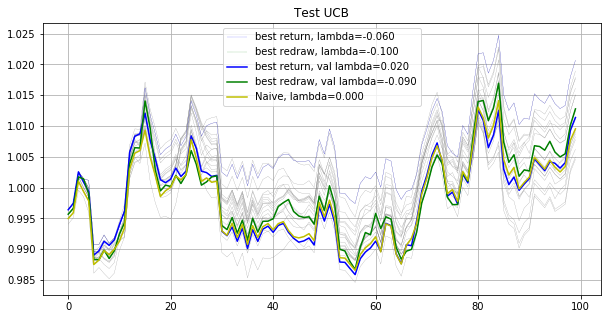

Phase 8
Validating...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.03848228    Max redraw: 0.01519853
lambda: -0.090   Total log return: -0.03872272    Max redraw: 0.01519853
lambda: -0.080   Total log return: -0.04364150    Max redraw: 0.01519853
lambda: -0.070   Total log return: -0.04587693    Max redraw: 0.01519853
lambda: -0.060   Total log return: -0.04587693    Max redraw: 0.01519853
lambda: -0.050   Total log return: -0.04839420    Max redraw: 0.01519853
lambda: -0.040   Total log return: -0.04612985    Max redraw: 0.01519853
lambda: -0.030   Total log return: -0.04429679    Max redraw: 0.01519853
lambda: -0.020   Total log return: -0.04606637    Max redraw: 0.01519853
lambda: -0.010   Total log return: -0.04587078    Max redraw: 0.01519853
lambda: -0.000   Total log return: -0.04780452    Max redraw: 0.01519853
lambda: 0.010   Total log return: -0.04996788    Max redraw: 0.01519853
lambda: 0.020   Total log return: -0.04924503 

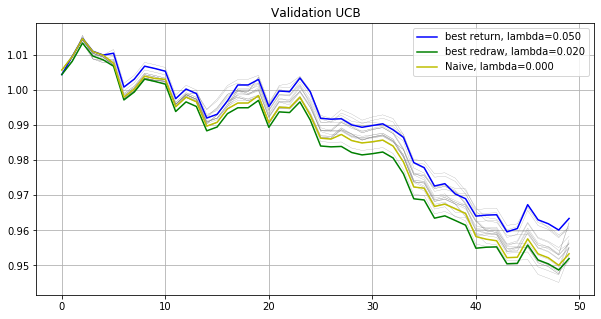

Testing...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.02025159    Max redraw: 0.01901383
lambda: -0.090   Total log return: 0.02092259    Max redraw: 0.01901383
lambda: -0.080   Total log return: 0.02485766    Max redraw: 0.01901383
lambda: -0.070   Total log return: 0.02393583    Max redraw: 0.01901383
lambda: -0.060   Total log return: 0.01681937    Max redraw: 0.01901383
lambda: -0.050   Total log return: 0.01740526    Max redraw: 0.01901383
lambda: -0.040   Total log return: 0.02679789    Max redraw: 0.01901383
lambda: -0.030   Total log return: 0.02887653    Max redraw: 0.01901383
lambda: -0.020   Total log return: 0.03392223    Max redraw: 0.01901383
lambda: -0.010   Total log return: 0.03050163    Max redraw: 0.01901383
lambda: -0.000   Total log return: 0.03089561    Max redraw: 0.01901383
lambda: 0.010   Total log return: 0.03226940    Max redraw: 0.01901383
lambda: 0.020   Total log return: 0.02152097    Max redraw: 0.0190138

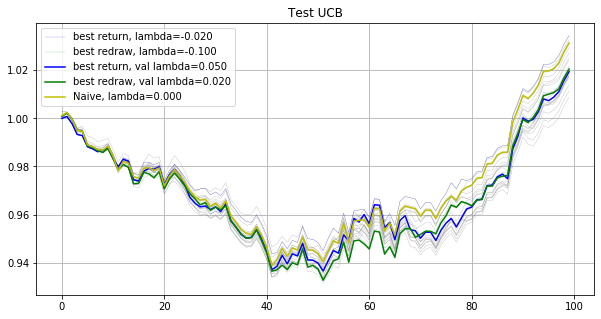

Phase 9
Validating...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.03160830    Max redraw: 0.01453574
lambda: -0.090   Total log return: 0.03372362    Max redraw: 0.01453574
lambda: -0.080   Total log return: 0.03481235    Max redraw: 0.01453574
lambda: -0.070   Total log return: 0.03458090    Max redraw: 0.01453574
lambda: -0.060   Total log return: 0.03572789    Max redraw: 0.01453574
lambda: -0.050   Total log return: 0.03699270    Max redraw: 0.01578226
lambda: -0.040   Total log return: 0.03575027    Max redraw: 0.01555840
lambda: -0.030   Total log return: 0.03454950    Max redraw: 0.01548078
lambda: -0.020   Total log return: 0.03554344    Max redraw: 0.01548078
lambda: -0.010   Total log return: 0.03697146    Max redraw: 0.01812107
lambda: -0.000   Total log return: 0.03400795    Max redraw: 0.01812107
lambda: 0.010   Total log return: 0.03368282    Max redraw: 0.01812107
lambda: 0.020   Total log return: 0.04324312    Max redraw

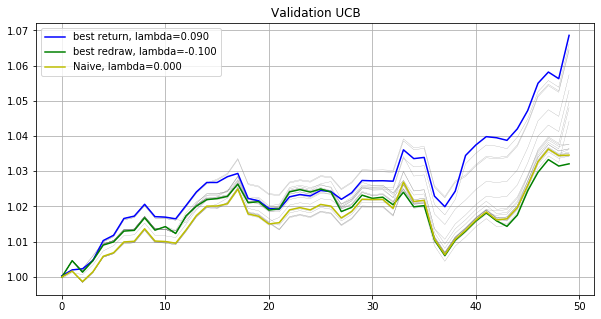

Testing...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00251679    Max redraw: 0.02470165
lambda: -0.090   Total log return: 0.00014490    Max redraw: 0.02470165
lambda: -0.080   Total log return: 0.00004113    Max redraw: 0.02470165
lambda: -0.070   Total log return: 0.00324114    Max redraw: 0.02435632
lambda: -0.060   Total log return: 0.01170509    Max redraw: 0.02435632
lambda: -0.050   Total log return: 0.01111204    Max redraw: 0.02435632
lambda: -0.040   Total log return: 0.00858489    Max redraw: 0.02756625
lambda: -0.030   Total log return: 0.01302762    Max redraw: 0.02756625
lambda: -0.020   Total log return: 0.00507731    Max redraw: 0.02561745
lambda: -0.010   Total log return: 0.00568843    Max redraw: 0.02561745
lambda: -0.000   Total log return: 0.00910598    Max redraw: 0.02561745
lambda: 0.010   Total log return: 0.02224760    Max redraw: 0.02408034
lambda: 0.020   Total log return: 0.01919785    Max redraw: 0.0240803

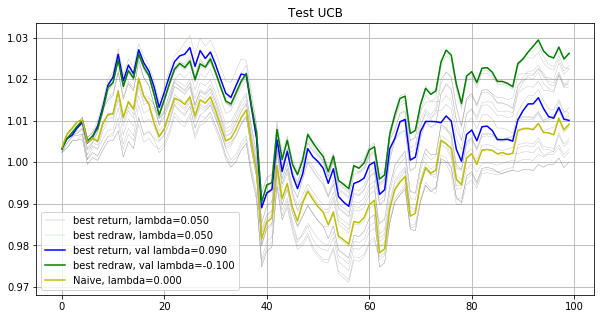

Phase 10
Validating...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.02805638    Max redraw: 0.01547591
lambda: -0.090   Total log return: -0.02728497    Max redraw: 0.01547591
lambda: -0.080   Total log return: -0.02848624    Max redraw: 0.01547591
lambda: -0.070   Total log return: -0.02757180    Max redraw: 0.01547065
lambda: -0.060   Total log return: -0.02696645    Max redraw: 0.01547065
lambda: -0.050   Total log return: -0.02686383    Max redraw: 0.01547065
lambda: -0.040   Total log return: -0.02367409    Max redraw: 0.01547065
lambda: -0.030   Total log return: -0.02380891    Max redraw: 0.01547065
lambda: -0.020   Total log return: -0.02678410    Max redraw: 0.01547065
lambda: -0.010   Total log return: -0.03408392    Max redraw: 0.01947555
lambda: -0.000   Total log return: -0.03651939    Max redraw: 0.01947555
lambda: 0.010   Total log return: -0.04507613    Max redraw: 0.01945032
lambda: 0.020   Total log return: -0.04481407

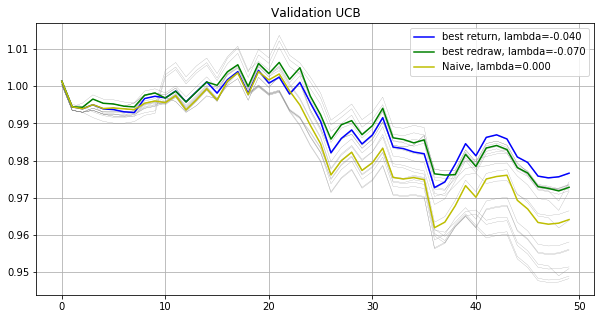

Testing...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.04277189    Max redraw: 0.02881796
lambda: -0.090   Total log return: -0.04607613    Max redraw: 0.02881796
lambda: -0.080   Total log return: -0.04953685    Max redraw: 0.02572345
lambda: -0.070   Total log return: -0.04567161    Max redraw: 0.02572345
lambda: -0.060   Total log return: -0.04482611    Max redraw: 0.02572345
lambda: -0.050   Total log return: -0.04511487    Max redraw: 0.02572345
lambda: -0.040   Total log return: -0.04454619    Max redraw: 0.02572345
lambda: -0.030   Total log return: -0.04478631    Max redraw: 0.02540596
lambda: -0.020   Total log return: -0.04669877    Max redraw: 0.02511286
lambda: -0.010   Total log return: -0.05511542    Max redraw: 0.02511286
lambda: -0.000   Total log return: -0.05846375    Max redraw: 0.02511286
lambda: 0.010   Total log return: -0.06051417    Max redraw: 0.02511286
lambda: 0.020   Total log return: -0.06143724    Max redr

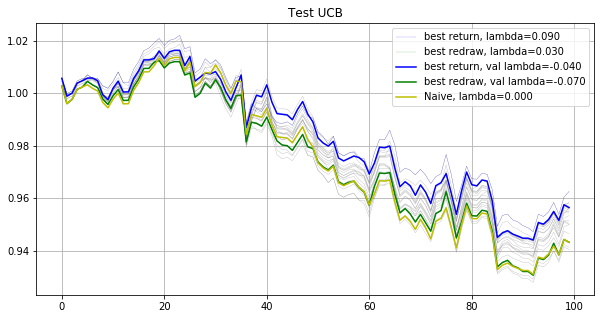

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.03517835
Mean return: 1.00004939
best redraw strategy
Total return: 1.02227379
Mean return: 1.00003147
Naive strategy
Total return: 1.02226477
Mean return: 1.00003146


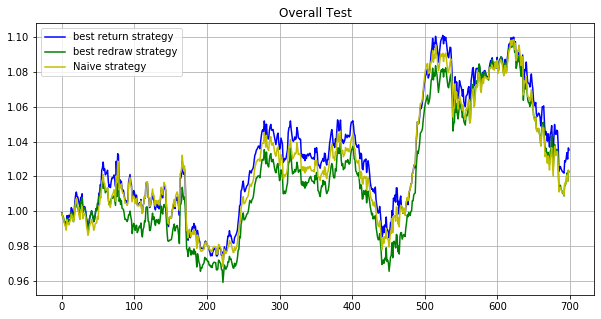

In [83]:
lb = 5
maxiter = 5000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb)

## main2_inv_M20_iter5000_mateye_subn100_lb5_s5 GGD

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 5000 --subn 100 --lb 5 --inverse --ggd --matid --M 20 --gpu 0  > ./log/main2_inv_ggd_M20_iter5000_mat10_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.01502969    Max redraw: 0.05962023
lambda: -0.090   Total log return: 0.02493810    Max redraw: 0.05962023
lambda: -0.080   Total log return: 0.02493810    Max redraw: 0.05962023
lambda: -0.070   Total log return: 0.02167957    Max redraw: 0.05962023
lambda: -0.060   Total log return: 0.02770763    Max redraw: 0.05962023
lambda: -0.050   Total log return: 0.01813138    Max redraw: 0.05962023
lambda: -0.040   Total log return: 0.02496080    Max redraw: 0.05962023
lambda: -0.030   Total log return: 0.03285093    Max redraw: 0.05962023
lambda: -0.020   Total log return: 0.03981044    Max redraw: 0.06252329
lambda: -0.010   Total log return: 0.03884063    Max redraw: 0.06252329
lambda: -0.000   Total log return: 0.04041044    Max redraw: 0.06252329
lambda: 0.010   Total log return: 0.05089057    Max redraw: 0.06252329
lambda: 0.020   Total log return: 0.06177393    Max redraw

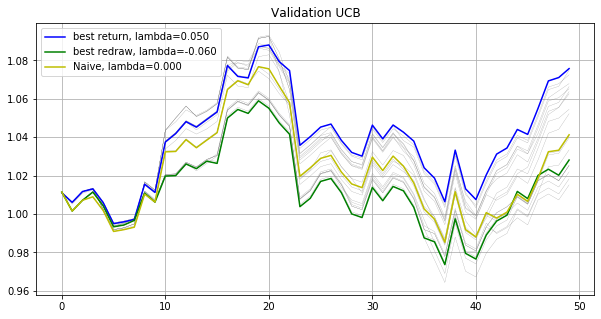

Testing...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00456729    Max redraw: 0.04774810
lambda: -0.090   Total log return: 0.01072686    Max redraw: 0.04774810
lambda: -0.080   Total log return: 0.00964130    Max redraw: 0.04977369
lambda: -0.070   Total log return: 0.03063069    Max redraw: 0.04977369
lambda: -0.060   Total log return: 0.03444461    Max redraw: 0.04977369
lambda: -0.050   Total log return: 0.04415125    Max redraw: 0.04977369
lambda: -0.040   Total log return: 0.04560011    Max redraw: 0.04977369
lambda: -0.030   Total log return: 0.02432272    Max redraw: 0.05238778
lambda: -0.020   Total log return: 0.03299476    Max redraw: 0.05238778
lambda: -0.010   Total log return: 0.03262772    Max redraw: 0.05238778
lambda: -0.000   Total log return: 0.03369784    Max redraw: 0.05144494
lambda: 0.010   Total log return: 0.01571372    Max redraw: 0.05144494
lambda: 0.020   Total log return: 0.01593639    Max redraw: 0.0514449

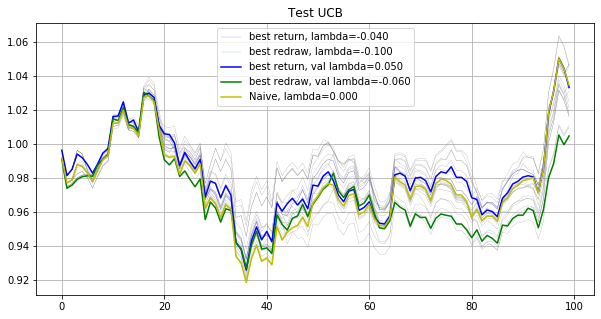

Phase 5
Validating...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.02073422    Max redraw: 0.03322712
lambda: -0.090   Total log return: 0.02881894    Max redraw: 0.03459065
lambda: -0.080   Total log return: 0.03781256    Max redraw: 0.02704006
lambda: -0.070   Total log return: 0.03788434    Max redraw: 0.02704006
lambda: -0.060   Total log return: 0.02718987    Max redraw: 0.02704006
lambda: -0.050   Total log return: 0.02996562    Max redraw: 0.02972111
lambda: -0.040   Total log return: 0.03038638    Max redraw: 0.02554901
lambda: -0.030   Total log return: 0.03027444    Max redraw: 0.02554901
lambda: -0.020   Total log return: 0.02473384    Max redraw: 0.02554901
lambda: -0.010   Total log return: 0.01303895    Max redraw: 0.02554901
lambda: -0.000   Total log return: 0.00972546    Max redraw: 0.02458486
lambda: 0.010   Total log return: -0.00167721    Max redraw: 0.02458486
lambda: 0.020   Total log return: -0.00643829    Max redr

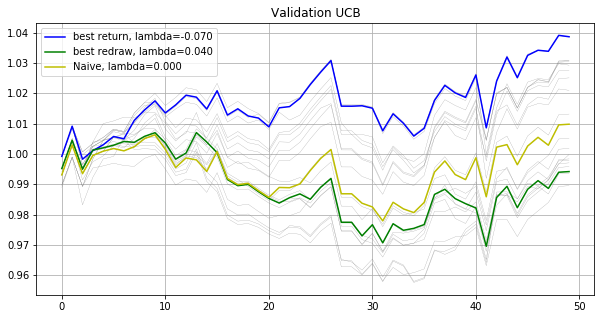

Testing...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.08478218    Max redraw: 0.06507042
lambda: -0.090   Total log return: 0.08506607    Max redraw: 0.06297412
lambda: -0.080   Total log return: 0.09733941    Max redraw: 0.06297412
lambda: -0.070   Total log return: 0.10308093    Max redraw: 0.06588650
lambda: -0.060   Total log return: 0.11453161    Max redraw: 0.06588650
lambda: -0.050   Total log return: 0.12031032    Max redraw: 0.06588650
lambda: -0.040   Total log return: 0.09565641    Max redraw: 0.06588650
lambda: -0.030   Total log return: 0.08638946    Max redraw: 0.06588650
lambda: -0.020   Total log return: 0.07709465    Max redraw: 0.06654270
lambda: -0.010   Total log return: 0.08108706    Max redraw: 0.06654270
lambda: -0.000   Total log return: 0.09423797    Max redraw: 0.06549709
lambda: 0.010   Total log return: 0.09487435    Max redraw: 0.06549709
lambda: 0.020   Total log return: 0.10834138    Max redraw: 0.0627619

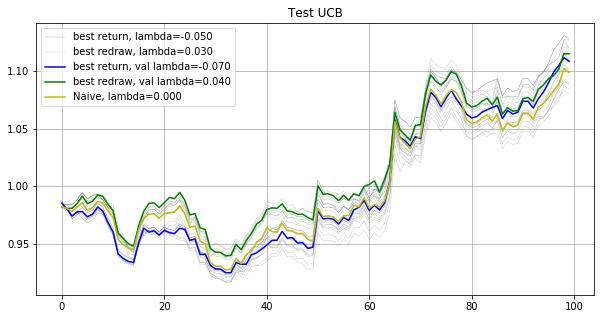

Phase 6
Validating...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.01267125    Max redraw: 0.04776617
lambda: -0.090   Total log return: 0.01682035    Max redraw: 0.04776617
lambda: -0.080   Total log return: 0.01010660    Max redraw: 0.04776617
lambda: -0.070   Total log return: 0.01574672    Max redraw: 0.05373703
lambda: -0.060   Total log return: 0.02774287    Max redraw: 0.05373703
lambda: -0.050   Total log return: 0.02405914    Max redraw: 0.05559620
lambda: -0.040   Total log return: 0.02273910    Max redraw: 0.05559620
lambda: -0.030   Total log return: 0.02204666    Max redraw: 0.05559620
lambda: -0.020   Total log return: 0.05196709    Max redraw: 0.02425983
lambda: -0.010   Total log return: 0.05653207    Max redraw: 0.02425983
lambda: -0.000   Total log return: 0.04417030    Max redraw: 0.04715124
lambda: 0.010   Total log return: 0.04751876    Max redraw: 0.04715124
lambda: 0.020   Total log return: 0.05283161    Max redraw

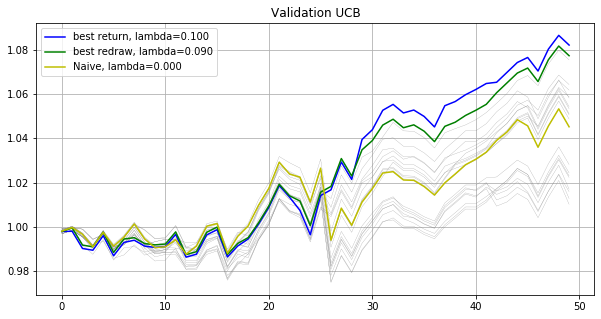

Testing...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.22394558    Max redraw: 0.03522771
lambda: -0.090   Total log return: 0.21534114    Max redraw: 0.03522771
lambda: -0.080   Total log return: 0.21259224    Max redraw: 0.03522771
lambda: -0.070   Total log return: 0.19959291    Max redraw: 0.03522771
lambda: -0.060   Total log return: 0.20914905    Max redraw: 0.03265953
lambda: -0.050   Total log return: 0.18905094    Max redraw: 0.03783017
lambda: -0.040   Total log return: 0.16808227    Max redraw: 0.03783017
lambda: -0.030   Total log return: 0.18351521    Max redraw: 0.03783017
lambda: -0.020   Total log return: 0.19037808    Max redraw: 0.03783017
lambda: -0.010   Total log return: 0.19035507    Max redraw: 0.04112678
lambda: -0.000   Total log return: 0.16007888    Max redraw: 0.04112678
lambda: 0.010   Total log return: 0.16241792    Max redraw: 0.04121156
lambda: 0.020   Total log return: 0.15390512    Max redraw: 0.0412115

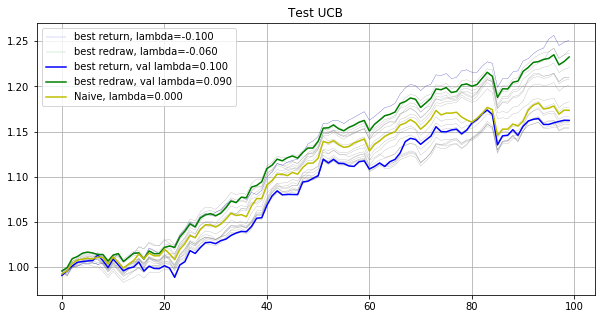

Phase 7
Validating...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00326989    Max redraw: 0.02635464
lambda: -0.090   Total log return: 0.00248717    Max redraw: 0.02635464
lambda: -0.080   Total log return: -0.01009606    Max redraw: 0.02635464
lambda: -0.070   Total log return: -0.00363379    Max redraw: 0.02635464
lambda: -0.060   Total log return: -0.00429160    Max redraw: 0.02635464
lambda: -0.050   Total log return: -0.00811486    Max redraw: 0.02522861
lambda: -0.040   Total log return: -0.00323468    Max redraw: 0.02522861
lambda: -0.030   Total log return: -0.00917885    Max redraw: 0.02738797
lambda: -0.020   Total log return: -0.00265955    Max redraw: 0.03073654
lambda: -0.010   Total log return: 0.01772890    Max redraw: 0.03073654
lambda: -0.000   Total log return: 0.02204639    Max redraw: 0.03073654
lambda: 0.010   Total log return: 0.03193499    Max redraw: 0.03073654
lambda: 0.020   Total log return: 0.02199663    Max

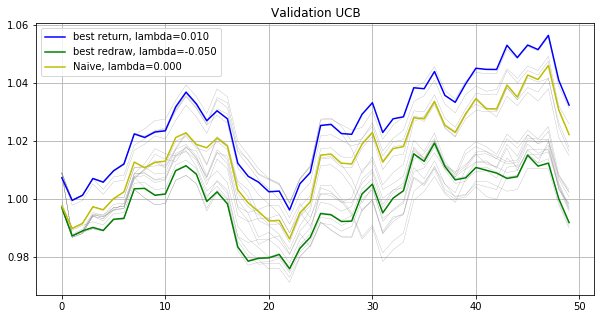

Testing...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.03685917    Max redraw: 0.04135355
lambda: -0.090   Total log return: 0.05278253    Max redraw: 0.04135355
lambda: -0.080   Total log return: 0.04922567    Max redraw: 0.04135355
lambda: -0.070   Total log return: 0.04367900    Max redraw: 0.04135355
lambda: -0.060   Total log return: 0.03457028    Max redraw: 0.04135355
lambda: -0.050   Total log return: 0.01202797    Max redraw: 0.03780978
lambda: -0.040   Total log return: 0.01555588    Max redraw: 0.03780978
lambda: -0.030   Total log return: 0.01925304    Max redraw: 0.03476660
lambda: -0.020   Total log return: 0.05441094    Max redraw: 0.03515291
lambda: -0.010   Total log return: 0.03966416    Max redraw: 0.03515291
lambda: -0.000   Total log return: 0.07032432    Max redraw: 0.03590469
lambda: 0.010   Total log return: 0.06399531    Max redraw: 0.03639993
lambda: 0.020   Total log return: 0.04706447    Max redraw: 0.0363999

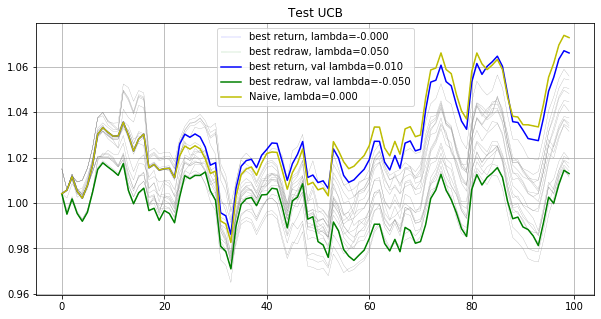

Phase 8
Validating...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00599714    Max redraw: 0.03154324
lambda: -0.090   Total log return: 0.02302848    Max redraw: 0.03154324
lambda: -0.080   Total log return: 0.02376656    Max redraw: 0.03154324
lambda: -0.070   Total log return: 0.01668309    Max redraw: 0.03380156
lambda: -0.060   Total log return: 0.01687294    Max redraw: 0.03380156
lambda: -0.050   Total log return: 0.02509222    Max redraw: 0.03380156
lambda: -0.040   Total log return: 0.01732973    Max redraw: 0.03638762
lambda: -0.030   Total log return: 0.00288862    Max redraw: 0.03638762
lambda: -0.020   Total log return: 0.00524724    Max redraw: 0.03638762
lambda: -0.010   Total log return: 0.00930698    Max redraw: 0.03224463
lambda: -0.000   Total log return: 0.00301097    Max redraw: 0.03224463
lambda: 0.010   Total log return: 0.00265943    Max redraw: 0.03256062
lambda: 0.020   Total log return: 0.00343179    Max redraw

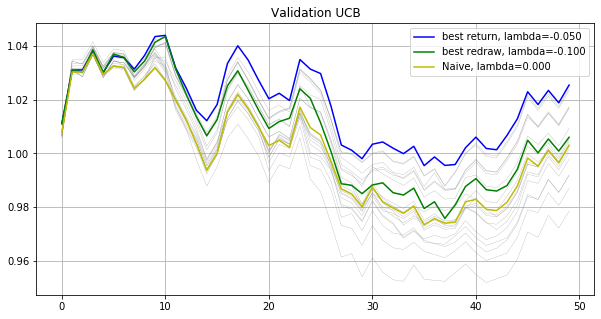

Testing...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.07746617    Max redraw: 0.04888048
lambda: -0.090   Total log return: 0.06551794    Max redraw: 0.04888048
lambda: -0.080   Total log return: 0.06666467    Max redraw: 0.04888048
lambda: -0.070   Total log return: 0.07076488    Max redraw: 0.05591512
lambda: -0.060   Total log return: 0.07701791    Max redraw: 0.05591512
lambda: -0.050   Total log return: 0.07814133    Max redraw: 0.05466914
lambda: -0.040   Total log return: 0.09134434    Max redraw: 0.05466914
lambda: -0.030   Total log return: 0.11581299    Max redraw: 0.04551385
lambda: -0.020   Total log return: 0.10367928    Max redraw: 0.04551385
lambda: -0.010   Total log return: 0.09427841    Max redraw: 0.04551385
lambda: -0.000   Total log return: 0.09373603    Max redraw: 0.04551385
lambda: 0.010   Total log return: 0.09793757    Max redraw: 0.04551385
lambda: 0.020   Total log return: 0.09957925    Max redraw: 0.0458251

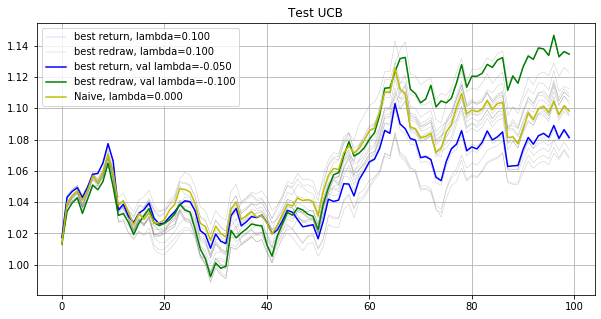

Phase 9
Validating...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00996719    Max redraw: 0.02699882
lambda: -0.090   Total log return: 0.01493461    Max redraw: 0.02699882
lambda: -0.080   Total log return: 0.01907351    Max redraw: 0.02698891
lambda: -0.070   Total log return: 0.01617623    Max redraw: 0.02698891
lambda: -0.060   Total log return: 0.01220506    Max redraw: 0.03086778
lambda: -0.050   Total log return: 0.02262651    Max redraw: 0.03086778
lambda: -0.040   Total log return: 0.00881731    Max redraw: 0.03086778
lambda: -0.030   Total log return: 0.00095377    Max redraw: 0.03086778
lambda: -0.020   Total log return: 0.03937314    Max redraw: 0.03265354
lambda: -0.010   Total log return: 0.03972992    Max redraw: 0.03265354
lambda: -0.000   Total log return: 0.03371755    Max redraw: 0.03587639
lambda: 0.010   Total log return: 0.02496198    Max redraw: 0.03383656
lambda: 0.020   Total log return: 0.03332193    Max redraw

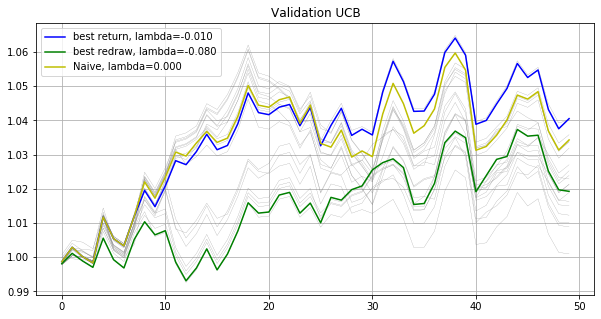

Testing...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.06215322    Max redraw: 0.04659731
lambda: -0.090   Total log return: 0.04598886    Max redraw: 0.04659731
lambda: -0.080   Total log return: 0.00292787    Max redraw: 0.04659731
lambda: -0.070   Total log return: 0.00667852    Max redraw: 0.04586147
lambda: -0.060   Total log return: -0.00497673    Max redraw: 0.04586147
lambda: -0.050   Total log return: -0.00103422    Max redraw: 0.04113223
lambda: -0.040   Total log return: 0.00836789    Max redraw: 0.04059712
lambda: -0.030   Total log return: 0.03410046    Max redraw: 0.04059712
lambda: -0.020   Total log return: 0.02279217    Max redraw: 0.03523689
lambda: -0.010   Total log return: 0.02200866    Max redraw: 0.03523689
lambda: -0.000   Total log return: 0.04044803    Max redraw: 0.03590087
lambda: 0.010   Total log return: 0.04053596    Max redraw: 0.03590087
lambda: 0.020   Total log return: 0.03533740    Max redraw: 0.03746

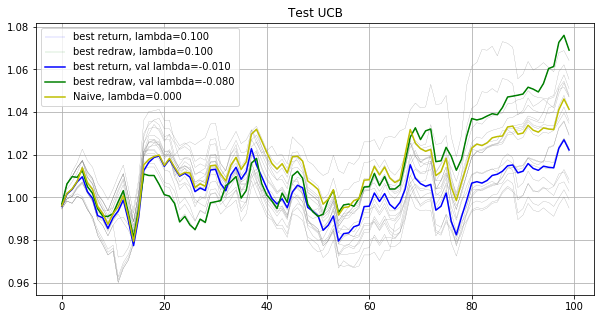

Phase 10
Validating...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.09492905    Max redraw: 0.03945987
lambda: -0.090   Total log return: -0.09412674    Max redraw: 0.03945987
lambda: -0.080   Total log return: -0.08562809    Max redraw: 0.03945987
lambda: -0.070   Total log return: -0.08027847    Max redraw: 0.03945987
lambda: -0.060   Total log return: -0.07756636    Max redraw: 0.04004093
lambda: -0.050   Total log return: -0.06695093    Max redraw: 0.04004093
lambda: -0.040   Total log return: -0.05409013    Max redraw: 0.04112280
lambda: -0.030   Total log return: -0.06591687    Max redraw: 0.04683306
lambda: -0.020   Total log return: -0.04924992    Max redraw: 0.04654376
lambda: -0.010   Total log return: -0.04793997    Max redraw: 0.04624571
lambda: -0.000   Total log return: -0.03488214    Max redraw: 0.04494961
lambda: 0.010   Total log return: -0.03244968    Max redraw: 0.04494961
lambda: 0.020   Total log return: -0.03734120

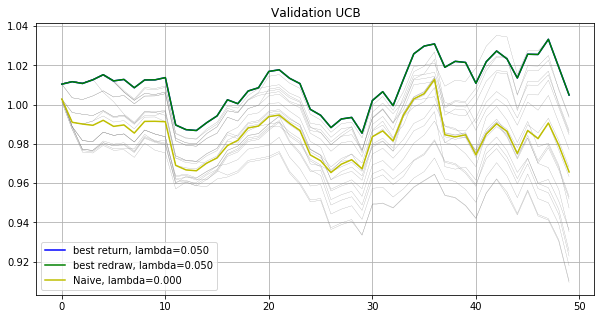

Testing...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.10182012    Max redraw: 0.03298667
lambda: -0.090   Total log return: 0.09209036    Max redraw: 0.03298667
lambda: -0.080   Total log return: 0.09578601    Max redraw: 0.03328014
lambda: -0.070   Total log return: 0.09756401    Max redraw: 0.03328014
lambda: -0.060   Total log return: 0.10148728    Max redraw: 0.03499845
lambda: -0.050   Total log return: 0.09664772    Max redraw: 0.03987281
lambda: -0.040   Total log return: 0.09852382    Max redraw: 0.03987281
lambda: -0.030   Total log return: 0.08929984    Max redraw: 0.03987281
lambda: -0.020   Total log return: 0.09583287    Max redraw: 0.03987281
lambda: -0.010   Total log return: 0.08988399    Max redraw: 0.03616513
lambda: -0.000   Total log return: 0.09439456    Max redraw: 0.03616513
lambda: 0.010   Total log return: 0.10122066    Max redraw: 0.03616513
lambda: 0.020   Total log return: 0.10627036    Max redraw: 0.0361651

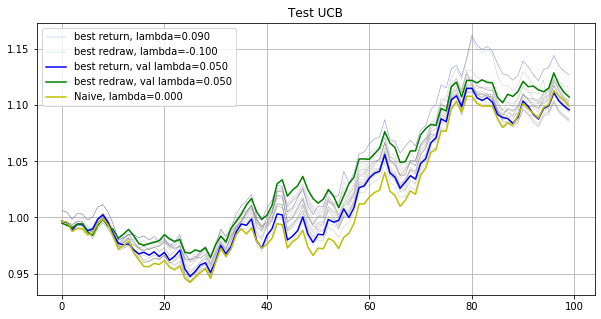

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.71879770
Mean return: 1.00077405
best redraw strategy
Total return: 1.87837445
Mean return: 1.00090099
Naive strategy
Total return: 1.79843641
Mean return: 1.00083881


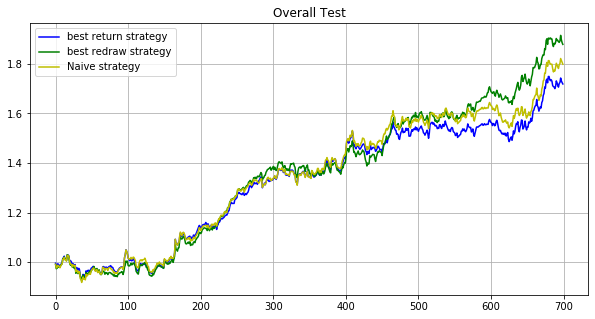

In [84]:
lb = 5
maxiter = 5000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb)

## main2_inv_M20_iter5000_mat10_subn100_lb5_s5 Gaussian

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 5000 --subn 100 --lb 5 --inverse --matid 48 35 83 25 84 19 21 71 24 68 --M 20 --gpu 0  > ./log/main2_inv_ggd_M20_iter5000_mat10_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.06558708    Max redraw: 0.04536319
lambda: -0.090   Total log return: 0.06414064    Max redraw: 0.04536319
lambda: -0.080   Total log return: 0.06214140    Max redraw: 0.05225177
lambda: -0.070   Total log return: 0.06618735    Max redraw: 0.05225177
lambda: -0.060   Total log return: 0.07229548    Max redraw: 0.05225177
lambda: -0.050   Total log return: 0.07275278    Max redraw: 0.05515019
lambda: -0.040   Total log return: 0.07288482    Max redraw: 0.05515019
lambda: -0.030   Total log return: 0.07984393    Max redraw: 0.05515019
lambda: -0.020   Total log return: 0.06821508    Max redraw: 0.05515019
lambda: -0.010   Total log return: 0.05435146    Max redraw: 0.05515019
lambda: -0.000   Total log return: 0.05706659    Max redraw: 0.05515019
lambda: 0.010   Total log return: 0.05581794    Max redraw: 0.05515019
lambda: 0.020   Total log return: 0.06028123    Max redraw

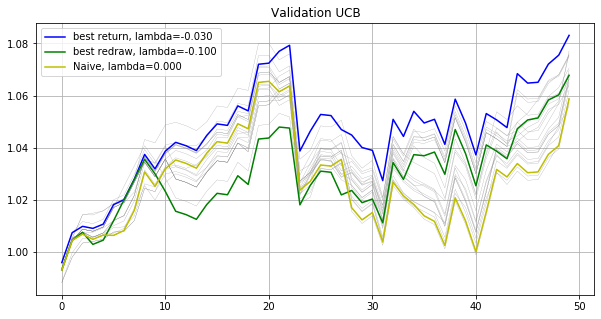

Testing...
./tmp2/res_phase04_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.01239705    Max redraw: 0.06975131
lambda: -0.090   Total log return: 0.04193142    Max redraw: 0.07233586
lambda: -0.080   Total log return: 0.04677988    Max redraw: 0.07188630
lambda: -0.070   Total log return: 0.04374450    Max redraw: 0.07188630
lambda: -0.060   Total log return: 0.05392490    Max redraw: 0.07188630
lambda: -0.050   Total log return: 0.06729847    Max redraw: 0.07188630
lambda: -0.040   Total log return: 0.05961015    Max redraw: 0.07188630
lambda: -0.030   Total log return: 0.05504292    Max redraw: 0.06898704
lambda: -0.020   Total log return: 0.04580181    Max redraw: 0.06898704
lambda: -0.010   Total log return: 0.04532213    Max redraw: 0.06898704
lambda: -0.000   Total log return: 0.04897943    Max redraw: 0.06898704
lambda: 0.010   Total log return: 0.05779710    Max redraw: 0.06898704
lambda: 0.020   Total log return: 0.04673829    Max redraw: 0.064234

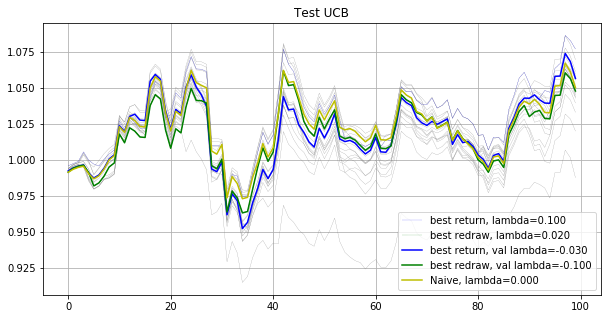

Phase 5
Validating...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00683052    Max redraw: 0.02881428
lambda: -0.090   Total log return: 0.01914136    Max redraw: 0.02685145
lambda: -0.080   Total log return: 0.02618247    Max redraw: 0.02685145
lambda: -0.070   Total log return: 0.02481961    Max redraw: 0.02685145
lambda: -0.060   Total log return: 0.01736446    Max redraw: 0.02685145
lambda: -0.050   Total log return: 0.01010149    Max redraw: 0.02685145
lambda: -0.040   Total log return: 0.01584241    Max redraw: 0.03212020
lambda: -0.030   Total log return: 0.01376098    Max redraw: 0.03063652
lambda: -0.020   Total log return: 0.01153310    Max redraw: 0.03063652
lambda: -0.010   Total log return: 0.01656911    Max redraw: 0.03063652
lambda: -0.000   Total log return: 0.00878063    Max redraw: 0.03063652
lambda: 0.010   Total log return: 0.00615257    Max redraw: 0.03063652
lambda: 0.020   Total log return: 0.01612296    Max redraw

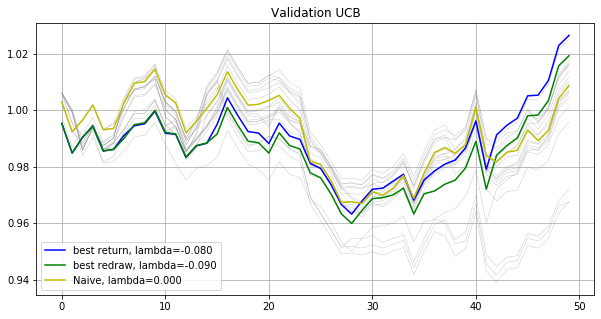

Testing...
./tmp2/res_phase05_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.10106584    Max redraw: 0.05977101
lambda: -0.090   Total log return: -0.11432479    Max redraw: 0.05977101
lambda: -0.080   Total log return: -0.12035807    Max redraw: 0.05977101
lambda: -0.070   Total log return: -0.10783352    Max redraw: 0.06126777
lambda: -0.060   Total log return: -0.08804060    Max redraw: 0.06126777
lambda: -0.050   Total log return: -0.07523474    Max redraw: 0.07450800
lambda: -0.040   Total log return: -0.09233499    Max redraw: 0.07292457
lambda: -0.030   Total log return: -0.06907785    Max redraw: 0.07292457
lambda: -0.020   Total log return: -0.07286599    Max redraw: 0.07292457
lambda: -0.010   Total log return: -0.07324464    Max redraw: 0.07292457
lambda: -0.000   Total log return: -0.07981695    Max redraw: 0.07292457
lambda: 0.010   Total log return: -0.07259602    Max redraw: 0.07292457
lambda: 0.020   Total log return: -0.04609885    Max redr

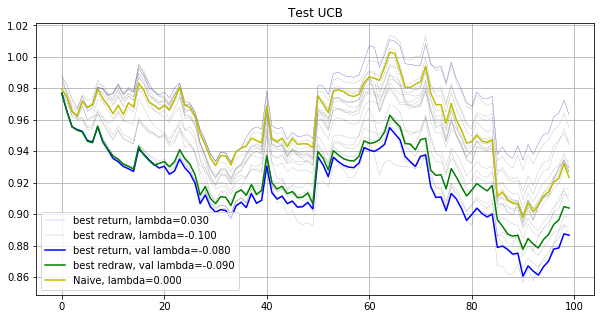

Phase 6
Validating...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.11997877    Max redraw: 0.02677201
lambda: -0.090   Total log return: 0.11504434    Max redraw: 0.02677201
lambda: -0.080   Total log return: 0.12136417    Max redraw: 0.02677201
lambda: -0.070   Total log return: 0.13191021    Max redraw: 0.02677201
lambda: -0.060   Total log return: 0.11349767    Max redraw: 0.02729995
lambda: -0.050   Total log return: 0.09931535    Max redraw: 0.02940266
lambda: -0.040   Total log return: 0.11844002    Max redraw: 0.02940266
lambda: -0.030   Total log return: 0.11424584    Max redraw: 0.02940266
lambda: -0.020   Total log return: 0.11618215    Max redraw: 0.02985100
lambda: -0.010   Total log return: 0.10438089    Max redraw: 0.02985100
lambda: -0.000   Total log return: 0.10704339    Max redraw: 0.02985100
lambda: 0.010   Total log return: 0.09887995    Max redraw: 0.02924032
lambda: 0.020   Total log return: 0.08455231    Max redraw

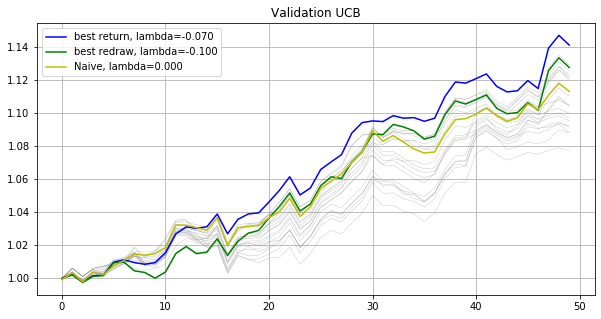

Testing...
./tmp2/res_phase06_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.08576931    Max redraw: 0.02892747
lambda: -0.090   Total log return: 0.08097993    Max redraw: 0.02823039
lambda: -0.080   Total log return: 0.07344215    Max redraw: 0.02823039
lambda: -0.070   Total log return: 0.06355346    Max redraw: 0.02808383
lambda: -0.060   Total log return: 0.04809654    Max redraw: 0.02989243
lambda: -0.050   Total log return: 0.05302814    Max redraw: 0.02989243
lambda: -0.040   Total log return: 0.04148360    Max redraw: 0.02989243
lambda: -0.030   Total log return: 0.02683698    Max redraw: 0.02989243
lambda: -0.020   Total log return: 0.02794600    Max redraw: 0.02989243
lambda: -0.010   Total log return: 0.05200462    Max redraw: 0.03165259
lambda: -0.000   Total log return: 0.05908798    Max redraw: 0.04100787
lambda: 0.010   Total log return: 0.07823710    Max redraw: 0.03839258
lambda: 0.020   Total log return: 0.08302244    Max redraw: 0.0383925

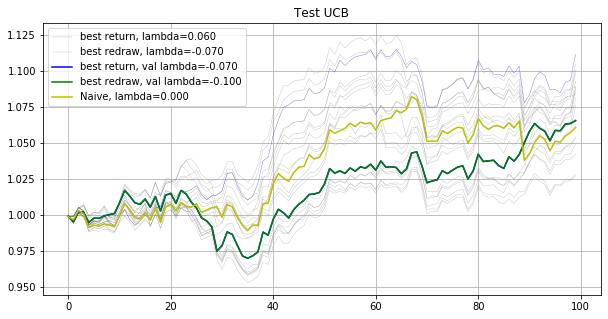

Phase 7
Validating...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00405392    Max redraw: 0.03478338
lambda: -0.090   Total log return: -0.00761064    Max redraw: 0.03478338
lambda: -0.080   Total log return: -0.00294374    Max redraw: 0.03478338
lambda: -0.070   Total log return: -0.02378777    Max redraw: 0.03478338
lambda: -0.060   Total log return: -0.02231111    Max redraw: 0.03478338
lambda: -0.050   Total log return: -0.00804518    Max redraw: 0.03478338
lambda: -0.040   Total log return: -0.01190370    Max redraw: 0.03541745
lambda: -0.030   Total log return: -0.02009084    Max redraw: 0.03495472
lambda: -0.020   Total log return: -0.02764599    Max redraw: 0.03379861
lambda: -0.010   Total log return: -0.02829850    Max redraw: 0.03411815
lambda: -0.000   Total log return: -0.04336604    Max redraw: 0.03411815
lambda: 0.010   Total log return: -0.03051588    Max redraw: 0.03411815
lambda: 0.020   Total log return: -0.01309427  

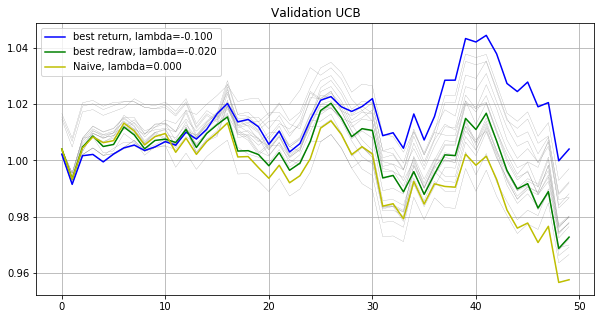

Testing...
./tmp2/res_phase07_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.06888595    Max redraw: 0.03797287
lambda: -0.090   Total log return: -0.05413597    Max redraw: 0.03817806
lambda: -0.080   Total log return: -0.07075679    Max redraw: 0.04512811
lambda: -0.070   Total log return: -0.05714066    Max redraw: 0.04376203
lambda: -0.060   Total log return: -0.07337983    Max redraw: 0.04449736
lambda: -0.050   Total log return: -0.07415894    Max redraw: 0.04338545
lambda: -0.040   Total log return: -0.06069640    Max redraw: 0.04422740
lambda: -0.030   Total log return: -0.08179909    Max redraw: 0.04422740
lambda: -0.020   Total log return: -0.07784403    Max redraw: 0.04422740
lambda: -0.010   Total log return: -0.06713569    Max redraw: 0.04112437
lambda: -0.000   Total log return: -0.03682360    Max redraw: 0.04112437
lambda: 0.010   Total log return: -0.04028205    Max redraw: 0.04192843
lambda: 0.020   Total log return: -0.02366372    Max redr

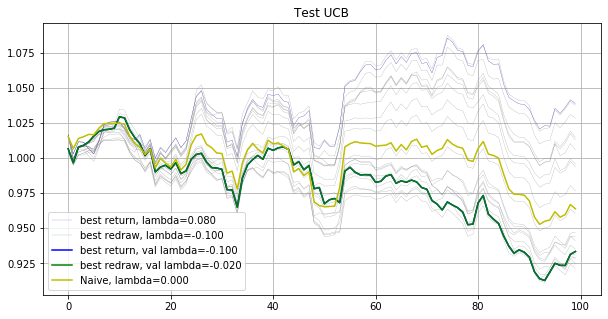

Phase 8
Validating...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.00236478    Max redraw: 0.02591567
lambda: -0.090   Total log return: -0.00641971    Max redraw: 0.02858004
lambda: -0.080   Total log return: -0.01262437    Max redraw: 0.02858004
lambda: -0.070   Total log return: -0.00879679    Max redraw: 0.02858004
lambda: -0.060   Total log return: -0.03153510    Max redraw: 0.02989613
lambda: -0.050   Total log return: -0.03399698    Max redraw: 0.02936936
lambda: -0.040   Total log return: -0.03774080    Max redraw: 0.03848068
lambda: -0.030   Total log return: -0.03693779    Max redraw: 0.03079264
lambda: -0.020   Total log return: -0.02575147    Max redraw: 0.03079264
lambda: -0.010   Total log return: -0.01986425    Max redraw: 0.03079264
lambda: -0.000   Total log return: -0.02828108    Max redraw: 0.03070705
lambda: 0.010   Total log return: -0.01630204    Max redraw: 0.03070705
lambda: 0.020   Total log return: -0.00528817  

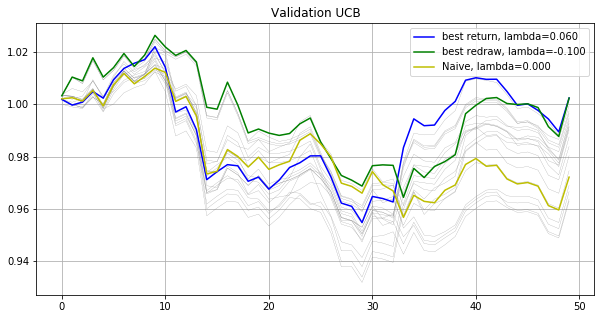

Testing...
./tmp2/res_phase08_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.11650710    Max redraw: 0.07064008
lambda: -0.090   Total log return: 0.11313792    Max redraw: 0.07064008
lambda: -0.080   Total log return: 0.10275491    Max redraw: 0.07257203
lambda: -0.070   Total log return: 0.10667015    Max redraw: 0.07257203
lambda: -0.060   Total log return: 0.11411626    Max redraw: 0.07376124
lambda: -0.050   Total log return: 0.11978172    Max redraw: 0.07376124
lambda: -0.040   Total log return: 0.07587641    Max redraw: 0.07250910
lambda: -0.030   Total log return: 0.08769347    Max redraw: 0.06460118
lambda: -0.020   Total log return: 0.10743777    Max redraw: 0.06460118
lambda: -0.010   Total log return: 0.11105739    Max redraw: 0.06460118
lambda: -0.000   Total log return: 0.10142521    Max redraw: 0.06460118
lambda: 0.010   Total log return: 0.11253990    Max redraw: 0.06460118
lambda: 0.020   Total log return: 0.11234506    Max redraw: 0.0646011

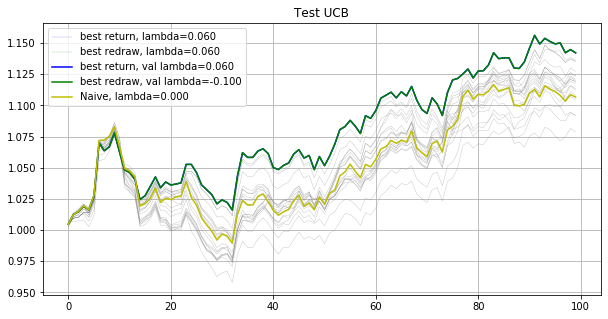

Phase 9
Validating...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.00653782    Max redraw: 0.03392896
lambda: -0.090   Total log return: -0.00842350    Max redraw: 0.03392896
lambda: -0.080   Total log return: -0.01273927    Max redraw: 0.03392896
lambda: -0.070   Total log return: -0.01760252    Max redraw: 0.03392896
lambda: -0.060   Total log return: -0.01248587    Max redraw: 0.03392896
lambda: -0.050   Total log return: -0.00821753    Max redraw: 0.03076454
lambda: -0.040   Total log return: -0.00853843    Max redraw: 0.03076454
lambda: -0.030   Total log return: -0.00887101    Max redraw: 0.03076454
lambda: -0.020   Total log return: -0.00012869    Max redraw: 0.03453045
lambda: -0.010   Total log return: -0.00057212    Max redraw: 0.03453045
lambda: -0.000   Total log return: -0.01008274    Max redraw: 0.03453045
lambda: 0.010   Total log return: -0.00275910    Max redraw: 0.03453045
lambda: 0.020   Total log return: -0.01076816 

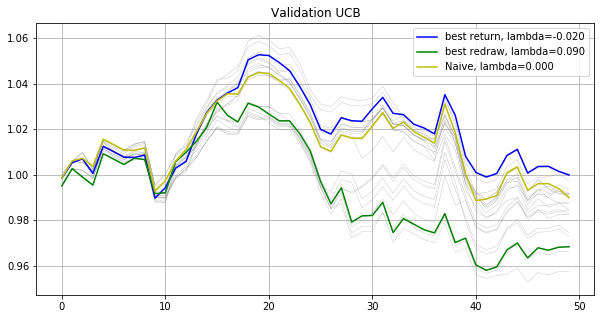

Testing...
./tmp2/res_phase09_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.03911109    Max redraw: 0.03710302
lambda: -0.090   Total log return: 0.05092328    Max redraw: 0.03710302
lambda: -0.080   Total log return: 0.04694106    Max redraw: 0.03710302
lambda: -0.070   Total log return: 0.06474451    Max redraw: 0.03710302
lambda: -0.060   Total log return: 0.07093334    Max redraw: 0.04075151
lambda: -0.050   Total log return: 0.06047686    Max redraw: 0.04075151
lambda: -0.040   Total log return: 0.06053883    Max redraw: 0.04075151
lambda: -0.030   Total log return: 0.06689699    Max redraw: 0.03708349
lambda: -0.020   Total log return: 0.06465648    Max redraw: 0.03708349
lambda: -0.010   Total log return: 0.07692073    Max redraw: 0.03799085
lambda: -0.000   Total log return: 0.07887937    Max redraw: 0.03968845
lambda: 0.010   Total log return: 0.06202089    Max redraw: 0.03729224
lambda: 0.020   Total log return: 0.07004051    Max redraw: 0.0372922

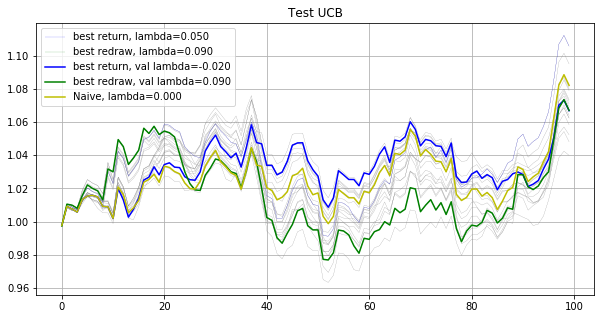

Phase 10
Validating...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: -0.12100826    Max redraw: 0.04065908
lambda: -0.090   Total log return: -0.12303691    Max redraw: 0.04065908
lambda: -0.080   Total log return: -0.12034471    Max redraw: 0.04065908
lambda: -0.070   Total log return: -0.11921376    Max redraw: 0.03890750
lambda: -0.060   Total log return: -0.12244989    Max redraw: 0.03890750
lambda: -0.050   Total log return: -0.09987825    Max redraw: 0.03856635
lambda: -0.040   Total log return: -0.08422619    Max redraw: 0.04075344
lambda: -0.030   Total log return: -0.08466132    Max redraw: 0.04075344
lambda: -0.020   Total log return: -0.07065345    Max redraw: 0.03522550
lambda: -0.010   Total log return: -0.08422702    Max redraw: 0.03522550
lambda: -0.000   Total log return: -0.08189237    Max redraw: 0.03449603
lambda: 0.010   Total log return: -0.07361362    Max redraw: 0.03449603
lambda: 0.020   Total log return: -0.08362896

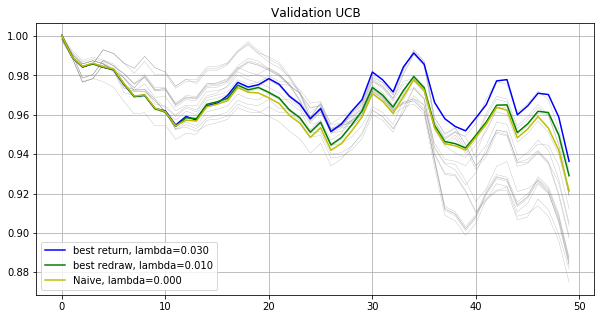

Testing...
./tmp2/res_phase10_iter5000_subn100_lb5.npz
UCB strategy
lambda: -0.100   Total log return: 0.08251888    Max redraw: 0.03882252
lambda: -0.090   Total log return: 0.10821930    Max redraw: 0.04293098
lambda: -0.080   Total log return: 0.10504869    Max redraw: 0.04293098
lambda: -0.070   Total log return: 0.09983630    Max redraw: 0.04429518
lambda: -0.060   Total log return: 0.10058014    Max redraw: 0.04429518
lambda: -0.050   Total log return: 0.09047370    Max redraw: 0.03929699
lambda: -0.040   Total log return: 0.10808791    Max redraw: 0.03929699
lambda: -0.030   Total log return: 0.13173944    Max redraw: 0.03929699
lambda: -0.020   Total log return: 0.14169584    Max redraw: 0.03929699
lambda: -0.010   Total log return: 0.14869577    Max redraw: 0.04592712
lambda: -0.000   Total log return: 0.15504274    Max redraw: 0.04592712
lambda: 0.010   Total log return: 0.17767298    Max redraw: 0.04592712
lambda: 0.020   Total log return: 0.17034464    Max redraw: 0.0459271

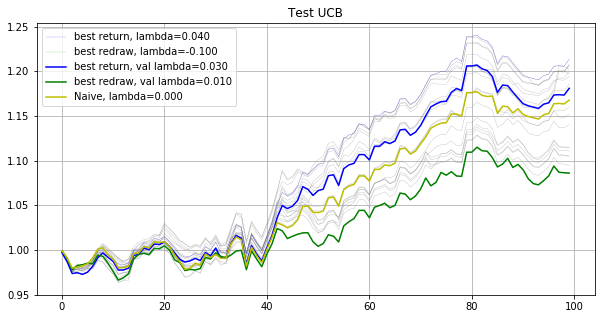

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.34079730
Mean return: 1.00041904
best redraw strategy
Total return: 1.24681391
Mean return: 1.00031518
Naive strategy
Total return: 1.38648835
Mean return: 1.00046693


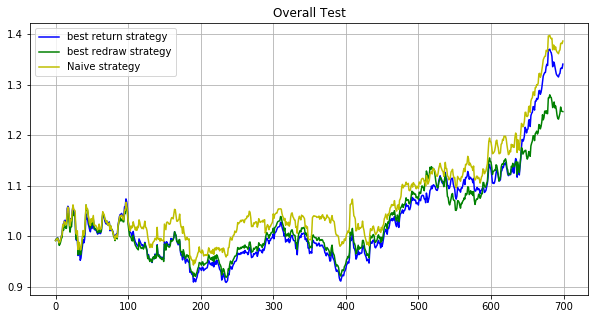

In [85]:
lb = 5
maxiter = 5000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb)

## main2_inv_M20_iter8000_mat20_subn100_lb5_s5 GGD

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 8000 --subn 100 --lb 5 --inverse --matid 48 35 83 25 84 19 21 71 24 68 81 38 51 56 77 43 80 15 30 60 --M 20 --ggd --gpu 0  > ./log/main2_inv_ggd_M20_iter8000_mat20_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.03199132    Max redraw: 0.06332431
lambda: -0.018   Total log return: 0.02969540    Max redraw: 0.06332431
lambda: -0.016   Total log return: 0.02969540    Max redraw: 0.06332431
lambda: -0.014   Total log return: 0.02969540    Max redraw: 0.06332431
lambda: -0.012   Total log return: 0.03450386    Max redraw: 0.06332431
lambda: -0.010   Total log return: 0.03410374    Max redraw: 0.06332431
lambda: -0.008   Total log return: 0.03410374    Max redraw: 0.06332431
lambda: -0.006   Total log return: 0.03718463    Max redraw: 0.06332431
lambda: -0.004   Total log return: 0.03663809    Max redraw: 0.06312568
lambda: -0.002   Total log return: 0.03525455    Max redraw: 0.06312568
lambda: -0.000   Total log return: 0.03525455    Max redraw: 0.06312568
lambda: 0.002   Total log return: 0.03705628    Max redraw: 0.06312568
lambda: 0.004   Total log return: 0.03705628    Max redraw

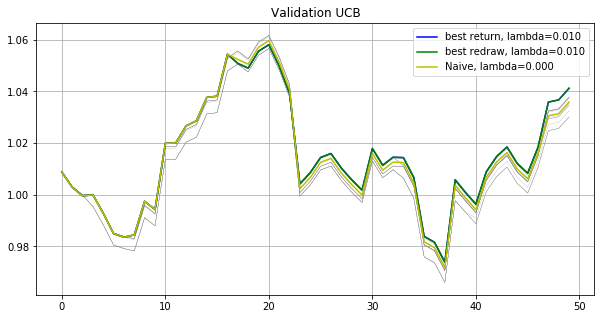

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01907559    Max redraw: 0.04769617
lambda: -0.018   Total log return: 0.01706698    Max redraw: 0.04769617
lambda: -0.016   Total log return: 0.02580395    Max redraw: 0.04769617
lambda: -0.014   Total log return: 0.02363641    Max redraw: 0.04769617
lambda: -0.012   Total log return: 0.02357457    Max redraw: 0.04769617
lambda: -0.010   Total log return: 0.02357457    Max redraw: 0.04769617
lambda: -0.008   Total log return: 0.02629112    Max redraw: 0.04769617
lambda: -0.006   Total log return: 0.02384042    Max redraw: 0.04769617
lambda: -0.004   Total log return: 0.02384042    Max redraw: 0.04769617
lambda: -0.002   Total log return: 0.02560678    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03274877    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.03388968    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03238148    Max redraw: 0.0474101

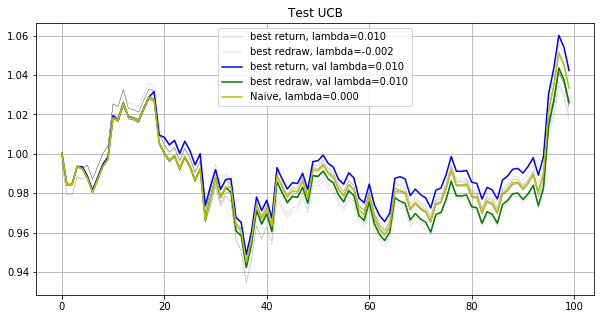

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.02811440    Max redraw: 0.03058474
lambda: -0.018   Total log return: 0.02422645    Max redraw: 0.03058474
lambda: -0.016   Total log return: 0.02899366    Max redraw: 0.03514809
lambda: -0.014   Total log return: 0.02834266    Max redraw: 0.03514809
lambda: -0.012   Total log return: 0.02860447    Max redraw: 0.03514809
lambda: -0.010   Total log return: 0.03402565    Max redraw: 0.03514809
lambda: -0.008   Total log return: 0.03590767    Max redraw: 0.03514809
lambda: -0.006   Total log return: 0.04093210    Max redraw: 0.03514809
lambda: -0.004   Total log return: 0.04160090    Max redraw: 0.03514809
lambda: -0.002   Total log return: 0.03743535    Max redraw: 0.03514809
lambda: -0.000   Total log return: 0.03645911    Max redraw: 0.03514809
lambda: 0.002   Total log return: 0.03216984    Max redraw: 0.03514809
lambda: 0.004   Total log return: 0.03350724    Max redraw

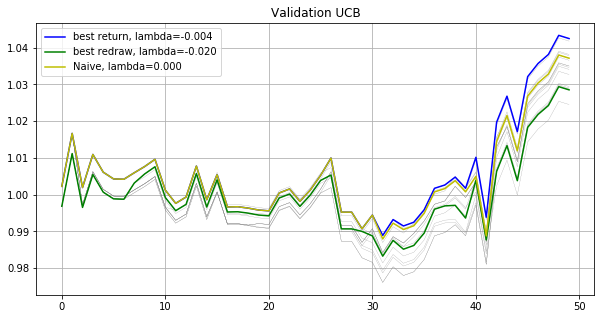

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09151227    Max redraw: 0.05005788
lambda: -0.018   Total log return: 0.08938893    Max redraw: 0.05005788
lambda: -0.016   Total log return: 0.08685249    Max redraw: 0.05005788
lambda: -0.014   Total log return: 0.08012579    Max redraw: 0.05005788
lambda: -0.012   Total log return: 0.05534385    Max redraw: 0.05005788
lambda: -0.010   Total log return: 0.06742772    Max redraw: 0.05005788
lambda: -0.008   Total log return: 0.06223151    Max redraw: 0.05005788
lambda: -0.006   Total log return: 0.06857884    Max redraw: 0.05005788
lambda: -0.004   Total log return: 0.06946537    Max redraw: 0.05005788
lambda: -0.002   Total log return: 0.06946537    Max redraw: 0.05005788
lambda: -0.000   Total log return: 0.06810189    Max redraw: 0.05005788
lambda: 0.002   Total log return: 0.07510040    Max redraw: 0.05005788
lambda: 0.004   Total log return: 0.07322719    Max redraw: 0.0500578

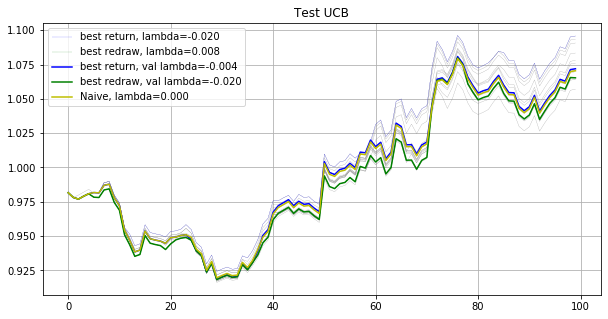

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.05209807    Max redraw: 0.05428521
lambda: -0.018   Total log return: 0.05123142    Max redraw: 0.05428521
lambda: -0.016   Total log return: 0.03710172    Max redraw: 0.05428521
lambda: -0.014   Total log return: 0.03675657    Max redraw: 0.05428521
lambda: -0.012   Total log return: 0.03658372    Max redraw: 0.05428521
lambda: -0.010   Total log return: 0.03312376    Max redraw: 0.05428521
lambda: -0.008   Total log return: 0.03312376    Max redraw: 0.05428521
lambda: -0.006   Total log return: 0.03312376    Max redraw: 0.05428521
lambda: -0.004   Total log return: 0.03099912    Max redraw: 0.05428521
lambda: -0.002   Total log return: 0.03109692    Max redraw: 0.05428521
lambda: -0.000   Total log return: 0.03086574    Max redraw: 0.05428521
lambda: 0.002   Total log return: 0.03378791    Max redraw: 0.05428521
lambda: 0.004   Total log return: 0.03051938    Max redraw

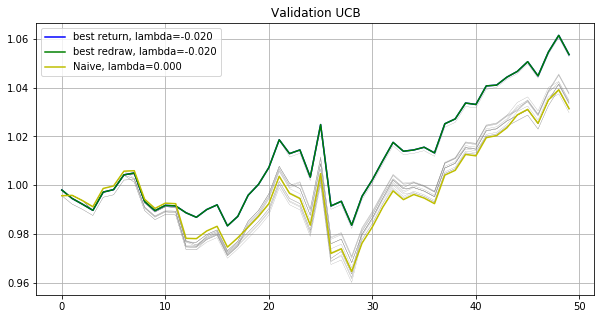

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.21275588    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.21407898    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21204089    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.20810794    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.20871479    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.21074918    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20574463    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20260543    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19941406    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20297008    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20322302    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19076919    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.19076919    Max redraw: 0.0442189

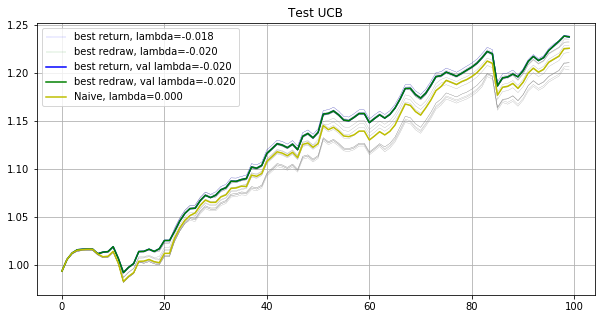

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01358802    Max redraw: 0.02571952
lambda: -0.018   Total log return: 0.01502924    Max redraw: 0.02571952
lambda: -0.016   Total log return: 0.01365909    Max redraw: 0.02571952
lambda: -0.014   Total log return: 0.01356226    Max redraw: 0.02571952
lambda: -0.012   Total log return: 0.01283996    Max redraw: 0.02571952
lambda: -0.010   Total log return: 0.02205673    Max redraw: 0.02571952
lambda: -0.008   Total log return: 0.01738834    Max redraw: 0.02571952
lambda: -0.006   Total log return: 0.01939439    Max redraw: 0.02571952
lambda: -0.004   Total log return: 0.01939439    Max redraw: 0.02571952
lambda: -0.002   Total log return: 0.01939439    Max redraw: 0.02571952
lambda: -0.000   Total log return: 0.02104429    Max redraw: 0.02571952
lambda: 0.002   Total log return: 0.01893248    Max redraw: 0.02571952
lambda: 0.004   Total log return: 0.02018986    Max redraw

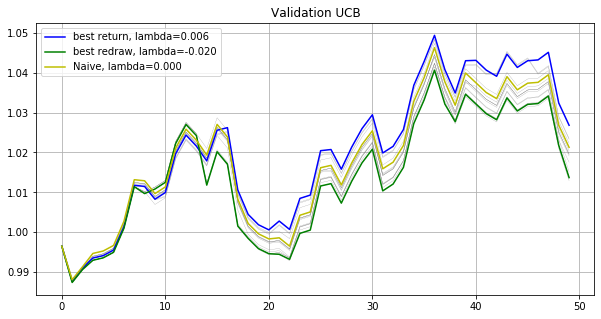

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09957430    Max redraw: 0.04022669
lambda: -0.018   Total log return: 0.10115233    Max redraw: 0.04022669
lambda: -0.016   Total log return: 0.10237989    Max redraw: 0.04022669
lambda: -0.014   Total log return: 0.10075882    Max redraw: 0.04022669
lambda: -0.012   Total log return: 0.09317260    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.08843231    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.08942659    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.09073422    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.09562841    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.09318663    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.08928344    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.08247575    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.08178763    Max redraw: 0.0398035

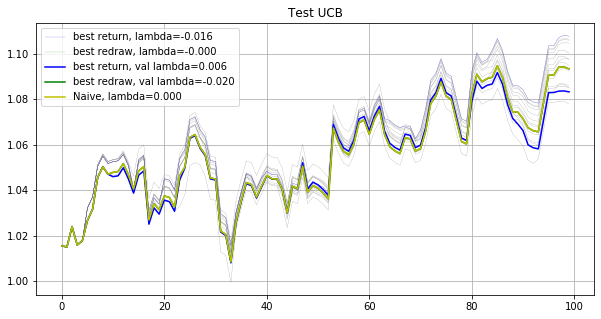

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.03557325    Max redraw: 0.03625933
lambda: -0.018   Total log return: 0.03623518    Max redraw: 0.03625933
lambda: -0.016   Total log return: 0.03672020    Max redraw: 0.03625933
lambda: -0.014   Total log return: 0.03311614    Max redraw: 0.03625933
lambda: -0.012   Total log return: 0.03339951    Max redraw: 0.03625933
lambda: -0.010   Total log return: 0.03284495    Max redraw: 0.03625933
lambda: -0.008   Total log return: 0.02749553    Max redraw: 0.03625933
lambda: -0.006   Total log return: 0.02873273    Max redraw: 0.03625933
lambda: -0.004   Total log return: 0.02675597    Max redraw: 0.03625933
lambda: -0.002   Total log return: 0.02550338    Max redraw: 0.03500675
lambda: -0.000   Total log return: 0.02393783    Max redraw: 0.03500675
lambda: 0.002   Total log return: 0.02654926    Max redraw: 0.03500675
lambda: 0.004   Total log return: 0.02704742    Max redraw

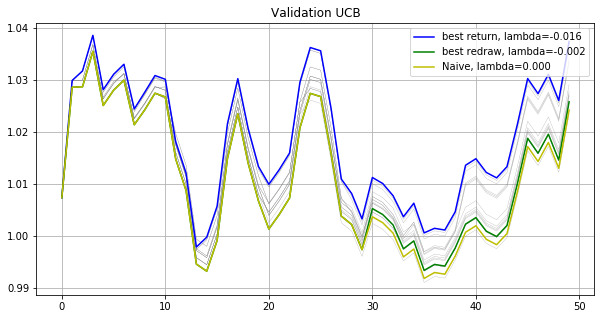

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04553642    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04211088    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04640352    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04641659    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.04268922    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04485020    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04812757    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04001965    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04846572    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04786570    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.05463333    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.05036713    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05584257    Max redraw: 0.0415435

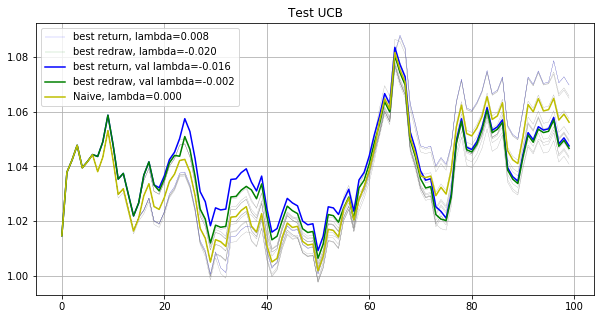

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.06534030    Max redraw: 0.02862917
lambda: -0.018   Total log return: 0.06275745    Max redraw: 0.02862917
lambda: -0.016   Total log return: 0.06029383    Max redraw: 0.02862917
lambda: -0.014   Total log return: 0.05612912    Max redraw: 0.02862917
lambda: -0.012   Total log return: 0.05634460    Max redraw: 0.02862917
lambda: -0.010   Total log return: 0.06014734    Max redraw: 0.02862917
lambda: -0.008   Total log return: 0.05634773    Max redraw: 0.02862917
lambda: -0.006   Total log return: 0.04552230    Max redraw: 0.02862917
lambda: -0.004   Total log return: 0.04935331    Max redraw: 0.02862917
lambda: -0.002   Total log return: 0.05476074    Max redraw: 0.02938876
lambda: -0.000   Total log return: 0.05503903    Max redraw: 0.02938876
lambda: 0.002   Total log return: 0.05181279    Max redraw: 0.03484496
lambda: 0.004   Total log return: 0.05805089    Max redraw

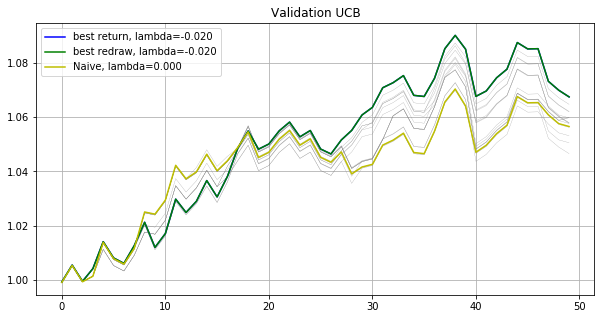

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.15266864    Max redraw: 0.03118418
lambda: -0.018   Total log return: 0.14776729    Max redraw: 0.03118418
lambda: -0.016   Total log return: 0.14972020    Max redraw: 0.03118418
lambda: -0.014   Total log return: 0.14615910    Max redraw: 0.03118418
lambda: -0.012   Total log return: 0.14703801    Max redraw: 0.03118418
lambda: -0.010   Total log return: 0.14623910    Max redraw: 0.03118418
lambda: -0.008   Total log return: 0.13622464    Max redraw: 0.03118418
lambda: -0.006   Total log return: 0.14162256    Max redraw: 0.03118418
lambda: -0.004   Total log return: 0.14016898    Max redraw: 0.03118418
lambda: -0.002   Total log return: 0.13511994    Max redraw: 0.03118418
lambda: -0.000   Total log return: 0.13975092    Max redraw: 0.03118418
lambda: 0.002   Total log return: 0.14191154    Max redraw: 0.03118418
lambda: 0.004   Total log return: 0.14096105    Max redraw: 0.0311841

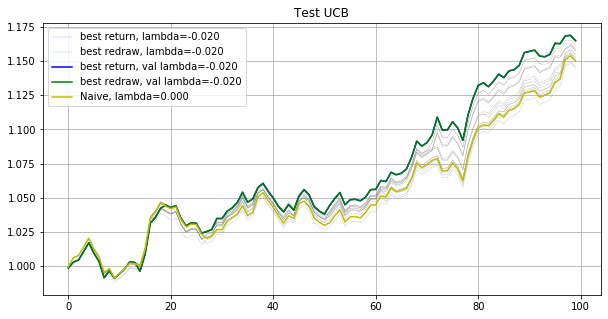

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: -0.08073179    Max redraw: 0.04709999
lambda: -0.018   Total log return: -0.07407612    Max redraw: 0.04709999
lambda: -0.016   Total log return: -0.07172146    Max redraw: 0.04474532
lambda: -0.014   Total log return: -0.07251946    Max redraw: 0.04474532
lambda: -0.012   Total log return: -0.07652885    Max redraw: 0.04685666
lambda: -0.010   Total log return: -0.07573153    Max redraw: 0.04685666
lambda: -0.008   Total log return: -0.08392496    Max redraw: 0.04685666
lambda: -0.006   Total log return: -0.07444981    Max redraw: 0.04685666
lambda: -0.004   Total log return: -0.07345179    Max redraw: 0.04685666
lambda: -0.002   Total log return: -0.07383348    Max redraw: 0.04685666
lambda: -0.000   Total log return: -0.06727322    Max redraw: 0.04685666
lambda: 0.002   Total log return: -0.06727322    Max redraw: 0.04685666
lambda: 0.004   Total log return: -0.07251299

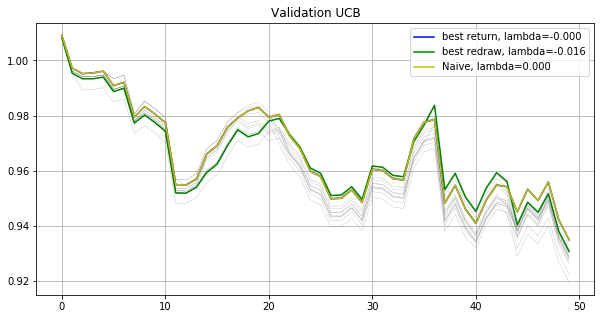

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.14487449    Max redraw: 0.04413971
lambda: -0.018   Total log return: 0.14359330    Max redraw: 0.04413971
lambda: -0.016   Total log return: 0.14602404    Max redraw: 0.04413971
lambda: -0.014   Total log return: 0.13681676    Max redraw: 0.04413971
lambda: -0.012   Total log return: 0.13415475    Max redraw: 0.04413971
lambda: -0.010   Total log return: 0.13196751    Max redraw: 0.04413971
lambda: -0.008   Total log return: 0.12726393    Max redraw: 0.04413971
lambda: -0.006   Total log return: 0.13764368    Max redraw: 0.04413971
lambda: -0.004   Total log return: 0.13734084    Max redraw: 0.04413971
lambda: -0.002   Total log return: 0.13533493    Max redraw: 0.04413971
lambda: -0.000   Total log return: 0.13144718    Max redraw: 0.04413971
lambda: 0.002   Total log return: 0.13224547    Max redraw: 0.04413971
lambda: 0.004   Total log return: 0.12932673    Max redraw: 0.0441397

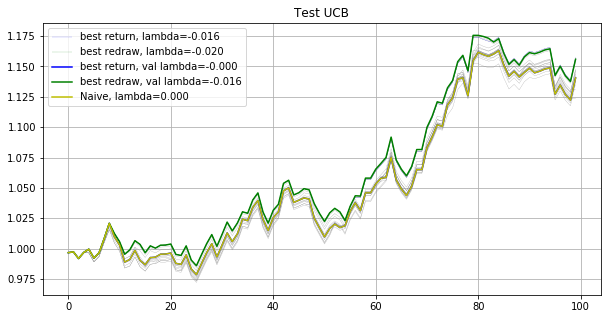

-----------------------------Final result-----------------------------
best return strategy
Total return: 2.08364271
Mean return: 1.00104929
best redraw strategy
Total return: 2.08343393
Mean return: 1.00104915
Naive strategy
Total return: 2.05276682
Mean return: 1.00102794


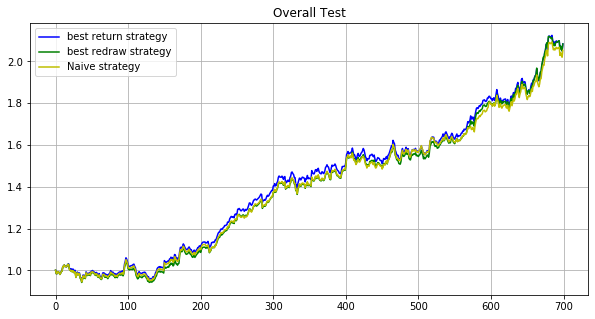

In [90]:
lb = 5
maxiter = 8000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002))

## main2_inv_M20_iter8000_mateye_subn100_lb5_s5 GGD

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 8000 --subn 100 --lb 5 --inverse --matid --M 20 --ggd --gpu 0  > ./log/main2_inv_ggd_M20_iter8000_mateye_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04700167    Max redraw: 0.06332431
lambda: -0.018   Total log return: 0.04701754    Max redraw: 0.06332431
lambda: -0.016   Total log return: 0.04746477    Max redraw: 0.06332431
lambda: -0.014   Total log return: 0.04593496    Max redraw: 0.06332431
lambda: -0.012   Total log return: 0.04524161    Max redraw: 0.06332431
lambda: -0.010   Total log return: 0.04524161    Max redraw: 0.06332431
lambda: -0.008   Total log return: 0.04489370    Max redraw: 0.06332431
lambda: -0.006   Total log return: 0.04987095    Max redraw: 0.06332431
lambda: -0.004   Total log return: 0.04987095    Max redraw: 0.06332431
lambda: -0.002   Total log return: 0.04349940    Max redraw: 0.06332431
lambda: -0.000   Total log return: 0.04448405    Max redraw: 0.06312568
lambda: 0.002   Total log return: 0.04509482    Max redraw: 0.06312568
lambda: 0.004   Total log return: 0.04509482    Max redraw

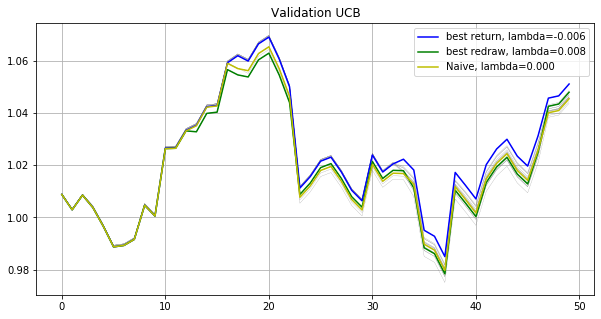

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00338772    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.00613584    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.00453113    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.00453113    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.00243160    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.00306136    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.00751732    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.00771789    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.01538005    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.01805450    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.01659031    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.01737106    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.01889162    Max redraw: 0.0474101

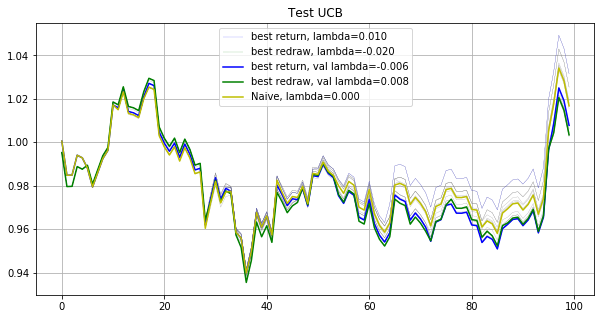

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.03272077    Max redraw: 0.03173711
lambda: -0.018   Total log return: 0.02785658    Max redraw: 0.03173711
lambda: -0.016   Total log return: 0.02843227    Max redraw: 0.03173711
lambda: -0.014   Total log return: 0.02550204    Max redraw: 0.03173711
lambda: -0.012   Total log return: 0.02360187    Max redraw: 0.03173711
lambda: -0.010   Total log return: 0.02211157    Max redraw: 0.03173711
lambda: -0.008   Total log return: 0.02237339    Max redraw: 0.03173711
lambda: -0.006   Total log return: 0.02109667    Max redraw: 0.03173711
lambda: -0.004   Total log return: 0.02176547    Max redraw: 0.03173711
lambda: -0.002   Total log return: 0.02678990    Max redraw: 0.03173711
lambda: -0.000   Total log return: 0.03379165    Max redraw: 0.03514809
lambda: 0.002   Total log return: 0.03379165    Max redraw: 0.03514809
lambda: 0.004   Total log return: 0.02871098    Max redraw

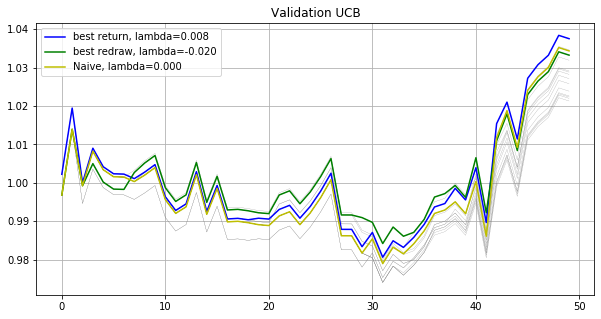

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.11460378    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.10453878    Max redraw: 0.04672079
lambda: -0.016   Total log return: 0.08299435    Max redraw: 0.04672079
lambda: -0.014   Total log return: 0.08639879    Max redraw: 0.04672079
lambda: -0.012   Total log return: 0.08607268    Max redraw: 0.04672079
lambda: -0.010   Total log return: 0.08544991    Max redraw: 0.04672079
lambda: -0.008   Total log return: 0.07875357    Max redraw: 0.04672079
lambda: -0.006   Total log return: 0.08510091    Max redraw: 0.04672079
lambda: -0.004   Total log return: 0.08183057    Max redraw: 0.04672079
lambda: -0.002   Total log return: 0.08723888    Max redraw: 0.04672079
lambda: -0.000   Total log return: 0.08495800    Max redraw: 0.04672079
lambda: 0.002   Total log return: 0.08619408    Max redraw: 0.04950321
lambda: 0.004   Total log return: 0.08887844    Max redraw: 0.0495032

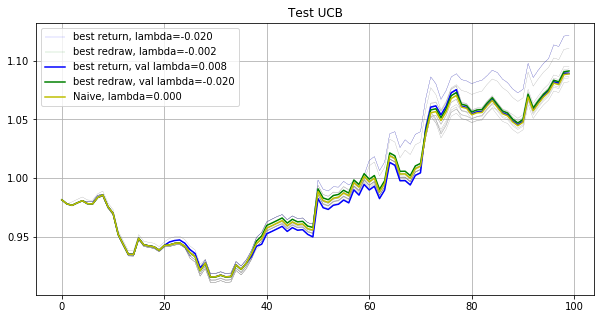

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04887688    Max redraw: 0.05428521
lambda: -0.018   Total log return: 0.04260502    Max redraw: 0.05428521
lambda: -0.016   Total log return: 0.03782183    Max redraw: 0.05428521
lambda: -0.014   Total log return: 0.03273107    Max redraw: 0.05428521
lambda: -0.012   Total log return: 0.03273107    Max redraw: 0.05428521
lambda: -0.010   Total log return: 0.02913533    Max redraw: 0.05428521
lambda: -0.008   Total log return: 0.02542202    Max redraw: 0.05428521
lambda: -0.006   Total log return: 0.02716715    Max redraw: 0.05428521
lambda: -0.004   Total log return: 0.02738856    Max redraw: 0.05428521
lambda: -0.002   Total log return: 0.02996273    Max redraw: 0.05428521
lambda: -0.000   Total log return: 0.03010268    Max redraw: 0.05428521
lambda: 0.002   Total log return: 0.03460834    Max redraw: 0.05428521
lambda: 0.004   Total log return: 0.03225121    Max redraw

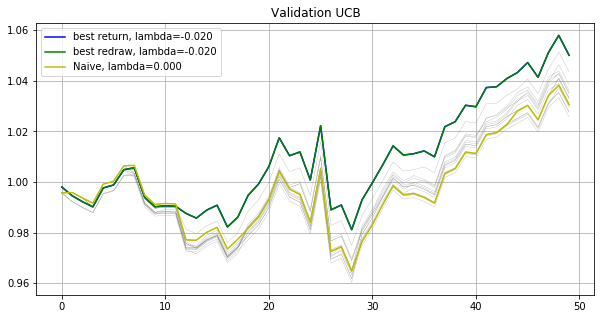

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.21028459    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20910166    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.20936707    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.20739770    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.20823989    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20366908    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20428995    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20130105    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19457181    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.19261730    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.19341747    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.18647571    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18827128    Max redraw: 0.0442189

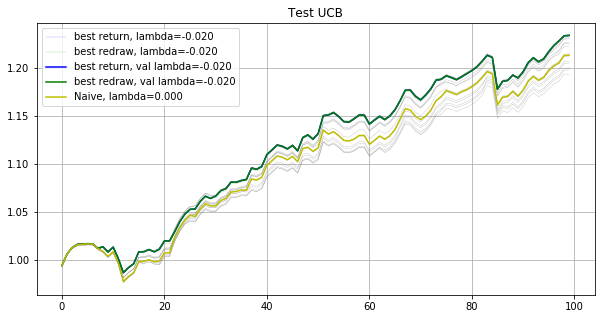

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.02176924    Max redraw: 0.02513642
lambda: -0.018   Total log return: 0.02104694    Max redraw: 0.02513642
lambda: -0.016   Total log return: 0.02152396    Max redraw: 0.02513642
lambda: -0.014   Total log return: 0.01959642    Max redraw: 0.02513642
lambda: -0.012   Total log return: 0.01959642    Max redraw: 0.02513642
lambda: -0.010   Total log return: 0.01527457    Max redraw: 0.02513642
lambda: -0.008   Total log return: 0.01138275    Max redraw: 0.02513642
lambda: -0.006   Total log return: 0.02140858    Max redraw: 0.02513642
lambda: -0.004   Total log return: 0.02140858    Max redraw: 0.02513642
lambda: -0.002   Total log return: 0.02140858    Max redraw: 0.02513642
lambda: -0.000   Total log return: 0.02054206    Max redraw: 0.02513642
lambda: 0.002   Total log return: 0.02123825    Max redraw: 0.02513642
lambda: 0.004   Total log return: 0.02494981    Max redraw

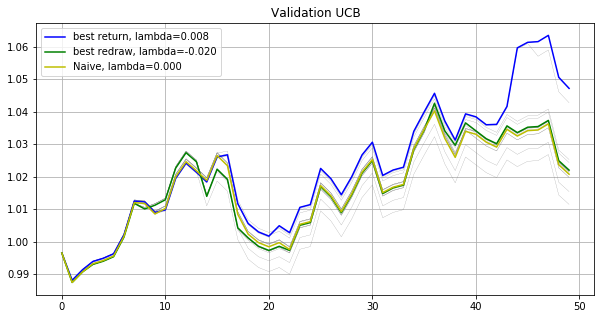

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09541611    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09774423    Max redraw: 0.04027295
lambda: -0.016   Total log return: 0.09683510    Max redraw: 0.04027295
lambda: -0.014   Total log return: 0.09817438    Max redraw: 0.04027295
lambda: -0.012   Total log return: 0.09744715    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09518298    Max redraw: 0.04117268
lambda: -0.008   Total log return: 0.10088843    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10032668    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.09811449    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.09594027    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09587416    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.08552526    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07923472    Max redraw: 0.0398035

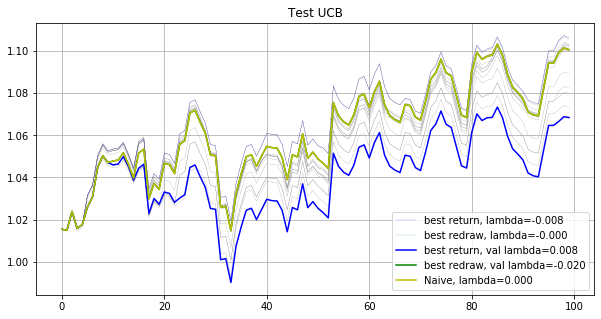

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.03596345    Max redraw: 0.03352205
lambda: -0.018   Total log return: 0.03380164    Max redraw: 0.03352205
lambda: -0.016   Total log return: 0.03380164    Max redraw: 0.03352205
lambda: -0.014   Total log return: 0.02923733    Max redraw: 0.03352205
lambda: -0.012   Total log return: 0.02923733    Max redraw: 0.03352205
lambda: -0.010   Total log return: 0.02868354    Max redraw: 0.03352205
lambda: -0.008   Total log return: 0.02474249    Max redraw: 0.03352205
lambda: -0.006   Total log return: 0.02457132    Max redraw: 0.03352205
lambda: -0.004   Total log return: 0.02457132    Max redraw: 0.03352205
lambda: -0.002   Total log return: 0.02485469    Max redraw: 0.03352205
lambda: -0.000   Total log return: 0.02778391    Max redraw: 0.03352205
lambda: 0.002   Total log return: 0.02844507    Max redraw: 0.03352205
lambda: 0.004   Total log return: 0.02299983    Max redraw

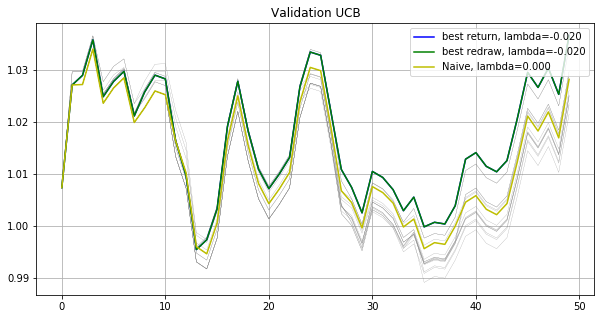

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04584137    Max redraw: 0.04514691
lambda: -0.018   Total log return: 0.04685090    Max redraw: 0.04514691
lambda: -0.016   Total log return: 0.05305202    Max redraw: 0.04514691
lambda: -0.014   Total log return: 0.04769353    Max redraw: 0.04514691
lambda: -0.012   Total log return: 0.04674621    Max redraw: 0.04514691
lambda: -0.010   Total log return: 0.04926250    Max redraw: 0.04514691
lambda: -0.008   Total log return: 0.04535309    Max redraw: 0.04514691
lambda: -0.006   Total log return: 0.05388342    Max redraw: 0.04514691
lambda: -0.004   Total log return: 0.05200009    Max redraw: 0.04514691
lambda: -0.002   Total log return: 0.05362706    Max redraw: 0.04514691
lambda: -0.000   Total log return: 0.05487662    Max redraw: 0.04514691
lambda: 0.002   Total log return: 0.05336454    Max redraw: 0.04514691
lambda: 0.004   Total log return: 0.05507067    Max redraw: 0.0451469

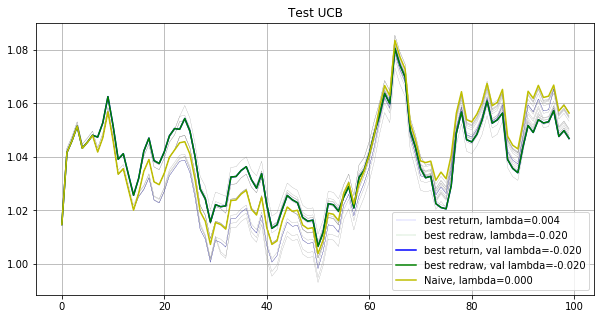

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04605506    Max redraw: 0.02862917
lambda: -0.018   Total log return: 0.04347221    Max redraw: 0.02862917
lambda: -0.016   Total log return: 0.04232782    Max redraw: 0.02862917
lambda: -0.014   Total log return: 0.04196479    Max redraw: 0.02862917
lambda: -0.012   Total log return: 0.04361912    Max redraw: 0.02862917
lambda: -0.010   Total log return: 0.04241993    Max redraw: 0.02862917
lambda: -0.008   Total log return: 0.03859688    Max redraw: 0.02862917
lambda: -0.006   Total log return: 0.02858829    Max redraw: 0.02862917
lambda: -0.004   Total log return: 0.03078709    Max redraw: 0.02862917
lambda: -0.002   Total log return: 0.03344556    Max redraw: 0.02862917
lambda: -0.000   Total log return: 0.03971874    Max redraw: 0.02938876
lambda: 0.002   Total log return: 0.03827986    Max redraw: 0.03484496
lambda: 0.004   Total log return: 0.03635130    Max redraw

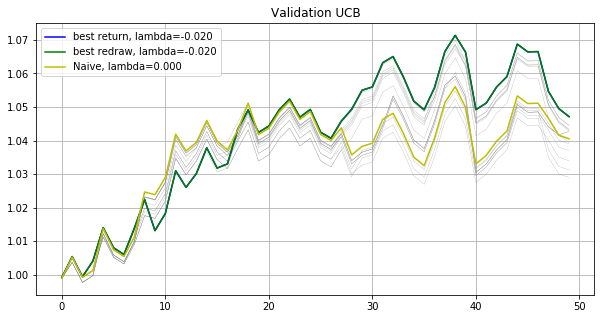

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.13480584    Max redraw: 0.03118418
lambda: -0.018   Total log return: 0.13458150    Max redraw: 0.03118418
lambda: -0.016   Total log return: 0.13442741    Max redraw: 0.03118418
lambda: -0.014   Total log return: 0.12529683    Max redraw: 0.03118418
lambda: -0.012   Total log return: 0.13418218    Max redraw: 0.03118418
lambda: -0.010   Total log return: 0.12953238    Max redraw: 0.03118418
lambda: -0.008   Total log return: 0.12570963    Max redraw: 0.03118418
lambda: -0.006   Total log return: 0.12714929    Max redraw: 0.03118418
lambda: -0.004   Total log return: 0.12822140    Max redraw: 0.03118418
lambda: -0.002   Total log return: 0.12708276    Max redraw: 0.03118418
lambda: -0.000   Total log return: 0.12636529    Max redraw: 0.03118418
lambda: 0.002   Total log return: 0.13482961    Max redraw: 0.03118418
lambda: 0.004   Total log return: 0.13099127    Max redraw: 0.0311841

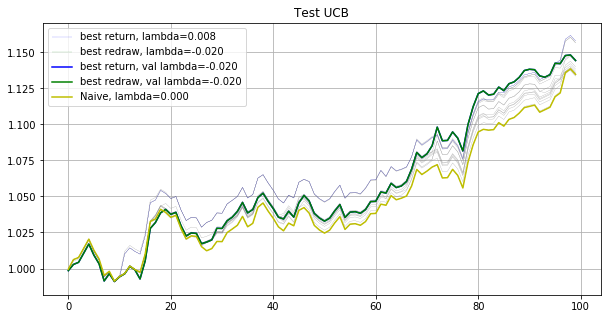

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: -0.06729159    Max redraw: 0.04926140
lambda: -0.018   Total log return: -0.06209607    Max redraw: 0.04926140
lambda: -0.016   Total log return: -0.06389453    Max redraw: 0.04926140
lambda: -0.014   Total log return: -0.06629720    Max redraw: 0.04685666
lambda: -0.012   Total log return: -0.06740354    Max redraw: 0.04685666
lambda: -0.010   Total log return: -0.06740354    Max redraw: 0.04685666
lambda: -0.008   Total log return: -0.07179360    Max redraw: 0.04685666
lambda: -0.006   Total log return: -0.07090652    Max redraw: 0.04685666
lambda: -0.004   Total log return: -0.06935926    Max redraw: 0.04685666
lambda: -0.002   Total log return: -0.06869558    Max redraw: 0.04685666
lambda: -0.000   Total log return: -0.07066160    Max redraw: 0.04685666
lambda: 0.002   Total log return: -0.07205735    Max redraw: 0.04685666
lambda: 0.004   Total log return: -0.07176868

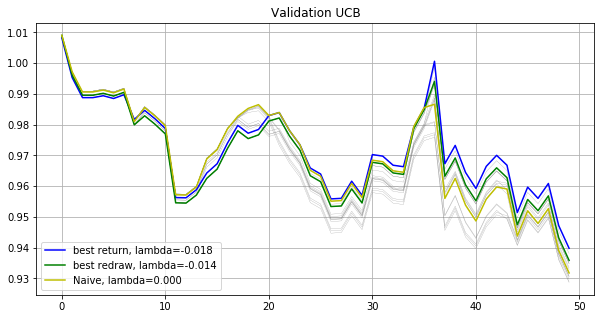

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.12326666    Max redraw: 0.04582980
lambda: -0.018   Total log return: 0.12626411    Max redraw: 0.04582980
lambda: -0.016   Total log return: 0.12404944    Max redraw: 0.04582980
lambda: -0.014   Total log return: 0.11717649    Max redraw: 0.04582980
lambda: -0.012   Total log return: 0.11482574    Max redraw: 0.04582980
lambda: -0.010   Total log return: 0.11599003    Max redraw: 0.04582980
lambda: -0.008   Total log return: 0.11599003    Max redraw: 0.04582980
lambda: -0.006   Total log return: 0.12555296    Max redraw: 0.04582980
lambda: -0.004   Total log return: 0.12555296    Max redraw: 0.04582980
lambda: -0.002   Total log return: 0.11684177    Max redraw: 0.04582980
lambda: -0.000   Total log return: 0.10397469    Max redraw: 0.04582980
lambda: 0.002   Total log return: 0.10377911    Max redraw: 0.04582980
lambda: 0.004   Total log return: 0.10307488    Max redraw: 0.0458298

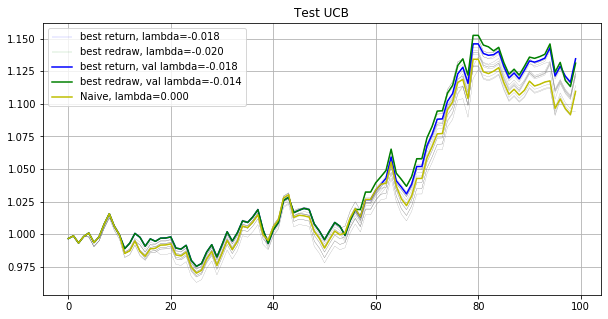

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.96685418
Mean return: 1.00096680
best redraw strategy
Total return: 2.01516124
Mean return: 1.00100150
Naive strategy
Total return: 1.96610913
Mean return: 1.00096626


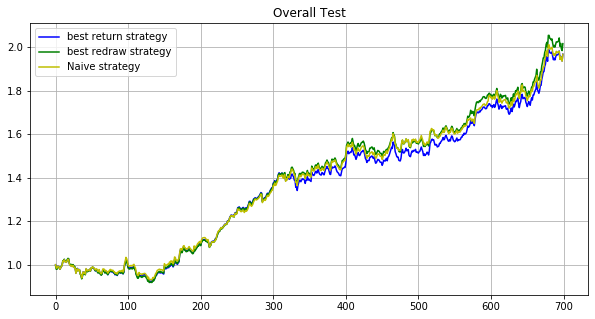

In [91]:
lb = 5
maxiter = 8000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002))

## main2_inv_M20_iter8000_mat20_subn100_lb5_s5 Gaussian

    #!/bin/bash
    for i in `seq 4 11`;
    do
        echo "phase $i"
        python main2.py --phase $i --maxiter 8000 --subn 100 --lb 5 --inverse --matid 48 35 83 25 84 19 21 71 24 68 81 38 51 56 77 43 80 15 30 60 --M 20 --gpu 0  > ./log/main2_inv_ggd_M20_iter8000_mateye_subn100_lb5_s5_log$i
    done

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01139958    Max redraw: 0.03904082
lambda: -0.018   Total log return: 0.00025400    Max redraw: 0.03904082
lambda: -0.016   Total log return: 0.00025400    Max redraw: 0.03904082
lambda: -0.014   Total log return: -0.00026320    Max redraw: 0.03904082
lambda: -0.012   Total log return: -0.00026320    Max redraw: 0.03904082
lambda: -0.010   Total log return: 0.00290051    Max redraw: 0.03904082
lambda: -0.008   Total log return: 0.00569378    Max redraw: 0.03927916
lambda: -0.006   Total log return: 0.00554151    Max redraw: 0.03927916
lambda: -0.004   Total log return: 0.00554151    Max redraw: 0.03927916
lambda: -0.002   Total log return: 0.00554151    Max redraw: 0.03927916
lambda: -0.000   Total log return: 0.01927045    Max redraw: 0.03927916
lambda: 0.002   Total log return: 0.01927045    Max redraw: 0.03927916
lambda: 0.004   Total log return: 0.01927045    Max redr

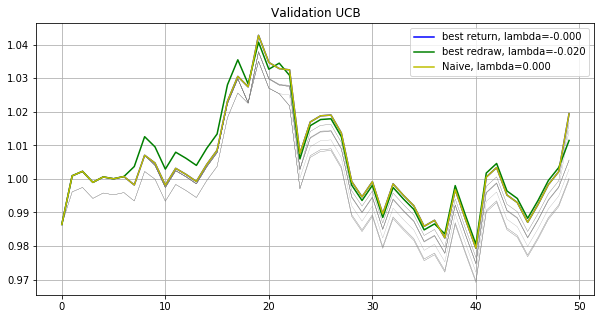

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.06144560    Max redraw: 0.07096911
lambda: -0.018   Total log return: 0.05717862    Max redraw: 0.07096911
lambda: -0.016   Total log return: 0.05674579    Max redraw: 0.07096911
lambda: -0.014   Total log return: 0.05269482    Max redraw: 0.07096911
lambda: -0.012   Total log return: 0.05913440    Max redraw: 0.07096911
lambda: -0.010   Total log return: 0.05905491    Max redraw: 0.07096911
lambda: -0.008   Total log return: 0.06123786    Max redraw: 0.07096911
lambda: -0.006   Total log return: 0.06607341    Max redraw: 0.07096911
lambda: -0.004   Total log return: 0.06900119    Max redraw: 0.07096911
lambda: -0.002   Total log return: 0.06590572    Max redraw: 0.07096911
lambda: -0.000   Total log return: 0.06070222    Max redraw: 0.07096911
lambda: 0.002   Total log return: 0.05806233    Max redraw: 0.07096911
lambda: 0.004   Total log return: 0.05439870    Max redraw: 0.0709691

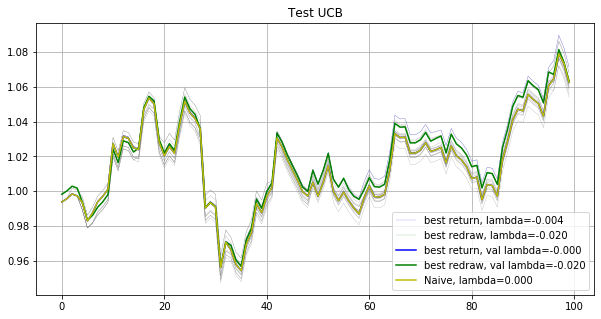

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01311310    Max redraw: 0.02904802
lambda: -0.018   Total log return: 0.01400887    Max redraw: 0.02904802
lambda: -0.016   Total log return: -0.00171480    Max redraw: 0.02904802
lambda: -0.014   Total log return: -0.00350506    Max redraw: 0.02904802
lambda: -0.012   Total log return: -0.00126895    Max redraw: 0.02904802
lambda: -0.010   Total log return: -0.00163225    Max redraw: 0.02904802
lambda: -0.008   Total log return: -0.00119463    Max redraw: 0.02904802
lambda: -0.006   Total log return: -0.00095587    Max redraw: 0.02904802
lambda: -0.004   Total log return: -0.00539551    Max redraw: 0.02904802
lambda: -0.002   Total log return: -0.00401374    Max redraw: 0.02904802
lambda: -0.000   Total log return: -0.00524671    Max redraw: 0.02904802
lambda: 0.002   Total log return: -0.00567254    Max redraw: 0.02904802
lambda: 0.004   Total log return: -0.00648816   

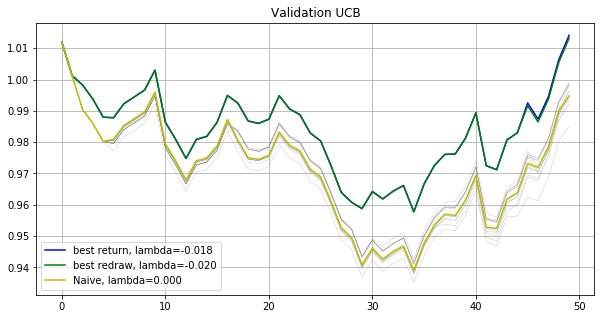

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: -0.05705781    Max redraw: 0.06735267
lambda: -0.018   Total log return: -0.04689171    Max redraw: 0.06735267
lambda: -0.016   Total log return: -0.05606049    Max redraw: 0.06735267
lambda: -0.014   Total log return: -0.05537038    Max redraw: 0.06735267
lambda: -0.012   Total log return: -0.06591976    Max redraw: 0.06735267
lambda: -0.010   Total log return: -0.06763022    Max redraw: 0.06735267
lambda: -0.008   Total log return: -0.08097097    Max redraw: 0.06735267
lambda: -0.006   Total log return: -0.08772845    Max redraw: 0.06735267
lambda: -0.004   Total log return: -0.08777282    Max redraw: 0.06735267
lambda: -0.002   Total log return: -0.09175162    Max redraw: 0.06735267
lambda: -0.000   Total log return: -0.09810996    Max redraw: 0.06735267
lambda: 0.002   Total log return: -0.10256594    Max redraw: 0.06735267
lambda: 0.004   Total log return: -0.10345918    Max redr

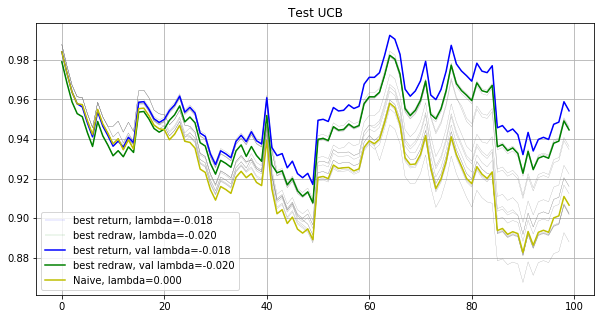

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.10393978    Max redraw: 0.03219424
lambda: -0.018   Total log return: 0.10393978    Max redraw: 0.03219424
lambda: -0.016   Total log return: 0.10533567    Max redraw: 0.03219424
lambda: -0.014   Total log return: 0.10533567    Max redraw: 0.03219424
lambda: -0.012   Total log return: 0.10920376    Max redraw: 0.03219424
lambda: -0.010   Total log return: 0.10920376    Max redraw: 0.03219424
lambda: -0.008   Total log return: 0.11622175    Max redraw: 0.03116800
lambda: -0.006   Total log return: 0.11622175    Max redraw: 0.03116800
lambda: -0.004   Total log return: 0.12145890    Max redraw: 0.03116800
lambda: -0.002   Total log return: 0.12164775    Max redraw: 0.03116800
lambda: -0.000   Total log return: 0.12164775    Max redraw: 0.03116800
lambda: 0.002   Total log return: 0.12213348    Max redraw: 0.03070920
lambda: 0.004   Total log return: 0.12592675    Max redraw

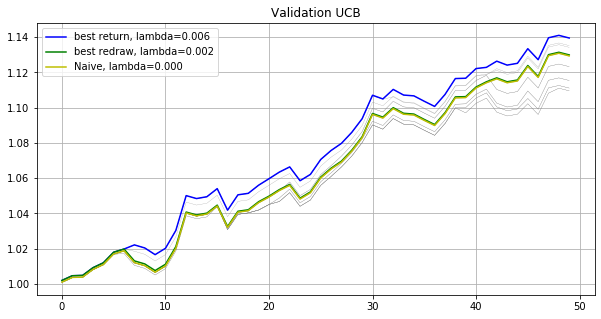

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.07156355    Max redraw: 0.03021259
lambda: -0.018   Total log return: 0.08362540    Max redraw: 0.02750469
lambda: -0.016   Total log return: 0.08805758    Max redraw: 0.02750469
lambda: -0.014   Total log return: 0.08707911    Max redraw: 0.02750469
lambda: -0.012   Total log return: 0.08711535    Max redraw: 0.02750469
lambda: -0.010   Total log return: 0.08224728    Max redraw: 0.02750469
lambda: -0.008   Total log return: 0.07545626    Max redraw: 0.02750469
lambda: -0.006   Total log return: 0.07805333    Max redraw: 0.02750469
lambda: -0.004   Total log return: 0.07221694    Max redraw: 0.02610906
lambda: -0.002   Total log return: 0.07221694    Max redraw: 0.02610906
lambda: -0.000   Total log return: 0.06637495    Max redraw: 0.02753845
lambda: 0.002   Total log return: 0.06711214    Max redraw: 0.02753845
lambda: 0.004   Total log return: 0.07384003    Max redraw: 0.0275384

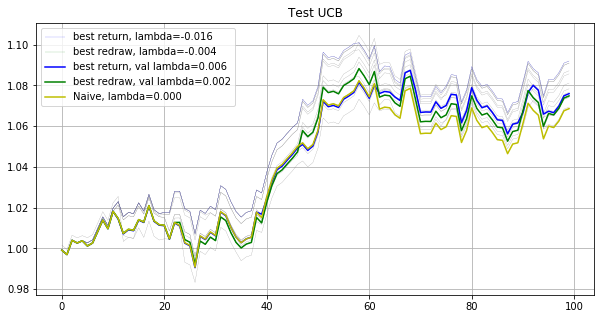

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00947692    Max redraw: 0.03235683
lambda: -0.018   Total log return: 0.00819683    Max redraw: 0.03235683
lambda: -0.016   Total log return: 0.00240912    Max redraw: 0.03235683
lambda: -0.014   Total log return: -0.00383620    Max redraw: 0.03235683
lambda: -0.012   Total log return: 0.00051276    Max redraw: 0.03276153
lambda: -0.010   Total log return: 0.00844123    Max redraw: 0.03276153
lambda: -0.008   Total log return: 0.00802846    Max redraw: 0.03276153
lambda: -0.006   Total log return: 0.00757421    Max redraw: 0.03276153
lambda: -0.004   Total log return: 0.01021751    Max redraw: 0.03276153
lambda: -0.002   Total log return: 0.01313339    Max redraw: 0.03276153
lambda: -0.000   Total log return: 0.01084286    Max redraw: 0.03276153
lambda: 0.002   Total log return: 0.01129044    Max redraw: 0.03276153
lambda: 0.004   Total log return: 0.01078689    Max redra

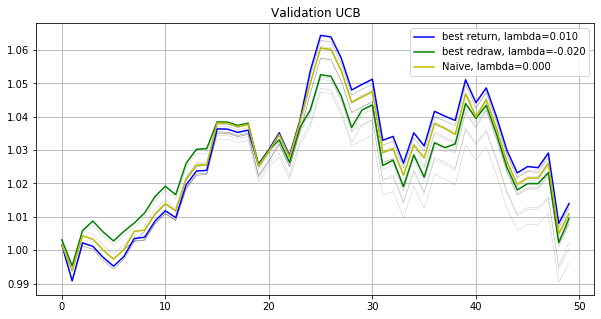

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: -0.01451736    Max redraw: 0.04733072
lambda: -0.018   Total log return: -0.01559356    Max redraw: 0.04731287
lambda: -0.016   Total log return: -0.01967127    Max redraw: 0.04731287
lambda: -0.014   Total log return: -0.02244488    Max redraw: 0.04731287
lambda: -0.012   Total log return: -0.01787777    Max redraw: 0.04731287
lambda: -0.010   Total log return: -0.01970201    Max redraw: 0.04731287
lambda: -0.008   Total log return: -0.02124197    Max redraw: 0.04731287
lambda: -0.006   Total log return: -0.01939365    Max redraw: 0.04731287
lambda: -0.004   Total log return: -0.01820129    Max redraw: 0.04731287
lambda: -0.002   Total log return: -0.01800931    Max redraw: 0.04731287
lambda: -0.000   Total log return: -0.01670338    Max redraw: 0.04731287
lambda: 0.002   Total log return: -0.01715556    Max redraw: 0.04731287
lambda: 0.004   Total log return: -0.02628914    Max redr

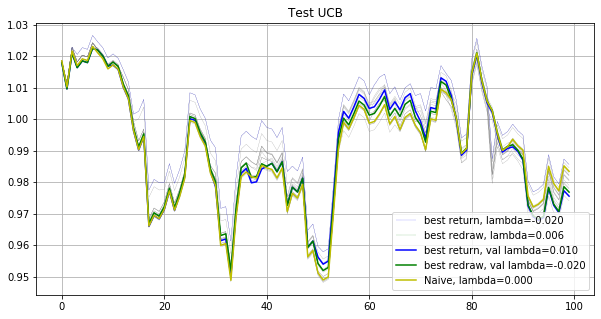

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: -0.03520926    Max redraw: 0.03541200
lambda: -0.018   Total log return: -0.03238989    Max redraw: 0.03541200
lambda: -0.016   Total log return: -0.03630283    Max redraw: 0.03541200
lambda: -0.014   Total log return: -0.03768245    Max redraw: 0.03541200
lambda: -0.012   Total log return: -0.03533073    Max redraw: 0.03541200
lambda: -0.010   Total log return: -0.03870753    Max redraw: 0.03541200
lambda: -0.008   Total log return: -0.03772949    Max redraw: 0.03541200
lambda: -0.006   Total log return: -0.04069300    Max redraw: 0.03541200
lambda: -0.004   Total log return: -0.03326444    Max redraw: 0.03541200
lambda: -0.002   Total log return: -0.02437687    Max redraw: 0.03034393
lambda: -0.000   Total log return: -0.02561772    Max redraw: 0.03034393
lambda: 0.002   Total log return: -0.01179217    Max redraw: 0.03292713
lambda: 0.004   Total log return: -0.01359365 

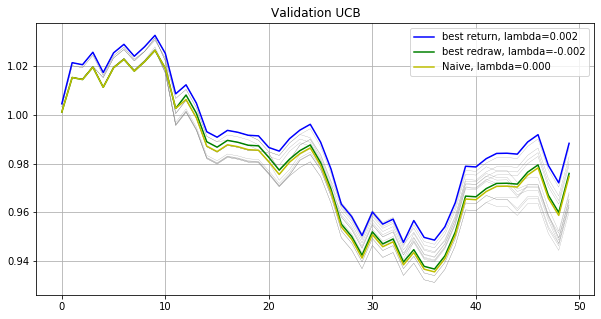

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08279382    Max redraw: 0.06245100
lambda: -0.018   Total log return: 0.08455584    Max redraw: 0.06245100
lambda: -0.016   Total log return: 0.08778769    Max redraw: 0.06245100
lambda: -0.014   Total log return: 0.08820297    Max redraw: 0.06245100
lambda: -0.012   Total log return: 0.07996145    Max redraw: 0.06245100
lambda: -0.010   Total log return: 0.07919931    Max redraw: 0.06245100
lambda: -0.008   Total log return: 0.07901375    Max redraw: 0.06245100
lambda: -0.006   Total log return: 0.07954518    Max redraw: 0.06245100
lambda: -0.004   Total log return: 0.08513866    Max redraw: 0.06245100
lambda: -0.002   Total log return: 0.08165482    Max redraw: 0.06293987
lambda: -0.000   Total log return: 0.07998137    Max redraw: 0.06293987
lambda: 0.002   Total log return: 0.08100201    Max redraw: 0.06390034
lambda: 0.004   Total log return: 0.07062367    Max redraw: 0.0644928

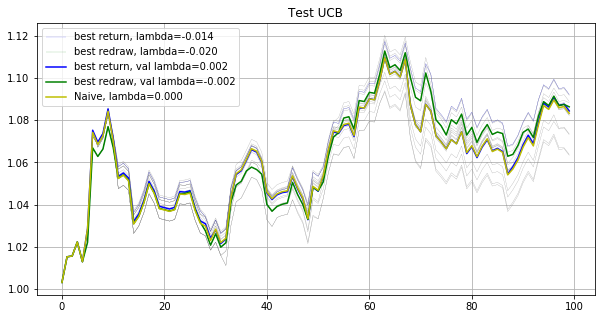

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01246242    Max redraw: 0.03345605
lambda: -0.018   Total log return: 0.01420082    Max redraw: 0.03345605
lambda: -0.016   Total log return: 0.01420082    Max redraw: 0.03345605
lambda: -0.014   Total log return: 0.01420082    Max redraw: 0.03345605
lambda: -0.012   Total log return: 0.01537243    Max redraw: 0.03345605
lambda: -0.010   Total log return: 0.01428649    Max redraw: 0.03345605
lambda: -0.008   Total log return: 0.01141495    Max redraw: 0.03345605
lambda: -0.006   Total log return: 0.01423170    Max redraw: 0.03345605
lambda: -0.004   Total log return: 0.01423170    Max redraw: 0.03345605
lambda: -0.002   Total log return: 0.00685595    Max redraw: 0.03345605
lambda: -0.000   Total log return: 0.00685595    Max redraw: 0.03345605
lambda: 0.002   Total log return: 0.00679055    Max redraw: 0.03345605
lambda: 0.004   Total log return: 0.00551986    Max redraw

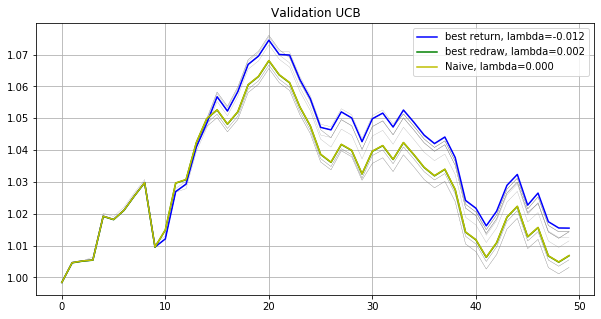

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.10942369    Max redraw: 0.03957095
lambda: -0.018   Total log return: 0.10456074    Max redraw: 0.03957095
lambda: -0.016   Total log return: 0.10328672    Max redraw: 0.03957095
lambda: -0.014   Total log return: 0.10087774    Max redraw: 0.03957095
lambda: -0.012   Total log return: 0.10137566    Max redraw: 0.03957095
lambda: -0.010   Total log return: 0.10780374    Max redraw: 0.03957095
lambda: -0.008   Total log return: 0.10352167    Max redraw: 0.03957095
lambda: -0.006   Total log return: 0.10295175    Max redraw: 0.03957095
lambda: -0.004   Total log return: 0.09240332    Max redraw: 0.03957095
lambda: -0.002   Total log return: 0.10441511    Max redraw: 0.03957095
lambda: -0.000   Total log return: 0.10727777    Max redraw: 0.03957095
lambda: 0.002   Total log return: 0.10525627    Max redraw: 0.03957095
lambda: 0.004   Total log return: 0.10688647    Max redraw: 0.0395709

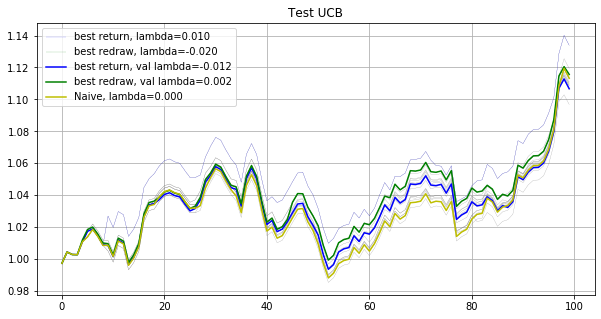

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: -0.12538477    Max redraw: 0.03436086
lambda: -0.018   Total log return: -0.12134007    Max redraw: 0.03188114
lambda: -0.016   Total log return: -0.12302590    Max redraw: 0.03188114
lambda: -0.014   Total log return: -0.12440563    Max redraw: 0.03188114
lambda: -0.012   Total log return: -0.12070318    Max redraw: 0.03188114
lambda: -0.010   Total log return: -0.12301189    Max redraw: 0.03188114
lambda: -0.008   Total log return: -0.12677764    Max redraw: 0.03188114
lambda: -0.006   Total log return: -0.11882087    Max redraw: 0.03609449
lambda: -0.004   Total log return: -0.11896295    Max redraw: 0.03609449
lambda: -0.002   Total log return: -0.12053815    Max redraw: 0.03609449
lambda: -0.000   Total log return: -0.12003466    Max redraw: 0.03609449
lambda: 0.002   Total log return: -0.11817281    Max redraw: 0.03609449
lambda: 0.004   Total log return: -0.12017543

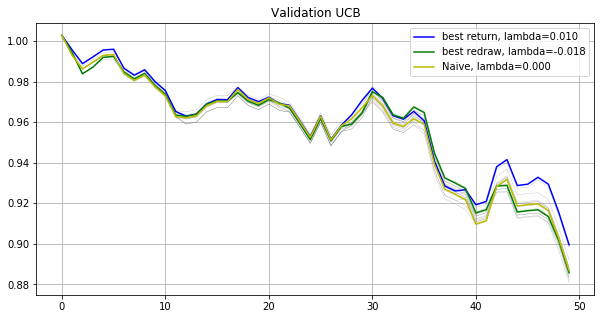

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.21571384    Max redraw: 0.04106300
lambda: -0.018   Total log return: 0.21463358    Max redraw: 0.04106300
lambda: -0.016   Total log return: 0.20589243    Max redraw: 0.04106300
lambda: -0.014   Total log return: 0.19727404    Max redraw: 0.04106300
lambda: -0.012   Total log return: 0.20394181    Max redraw: 0.04106300
lambda: -0.010   Total log return: 0.19824519    Max redraw: 0.04106300
lambda: -0.008   Total log return: 0.19395932    Max redraw: 0.04106300
lambda: -0.006   Total log return: 0.19699349    Max redraw: 0.04106300
lambda: -0.004   Total log return: 0.19891878    Max redraw: 0.04106300
lambda: -0.002   Total log return: 0.19318809    Max redraw: 0.04106300
lambda: -0.000   Total log return: 0.19067185    Max redraw: 0.04106300
lambda: 0.002   Total log return: 0.18928664    Max redraw: 0.04106300
lambda: 0.004   Total log return: 0.18714571    Max redraw: 0.0410630

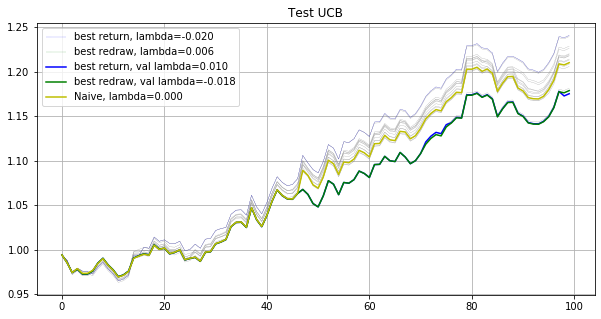

-----------------------------Final result-----------------------------
best return strategy
Total return: 1.50090285
Mean return: 1.00058026
best redraw strategy
Total return: 1.50647922
Mean return: 1.00058556
Naive strategy
Total return: 1.47726857
Mean return: 1.00055758


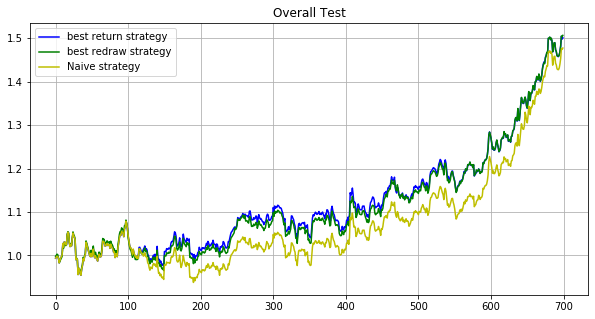

In [92]:
lb = 5
maxiter = 8000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002))